# First Move ~ all frequencies: BJH051

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import signal, stats
import re
import os
import mne
import IPython
import seaborn as sns
import scipy
import joblib
import h5io
import dask.array as da 

import statsmodels
from statsmodels import stats
from statsmodels.stats import multitest

## import custom functions
import sys
sys.path.append('/home/brooke/pacman/preprocessing/scripts')
import preproc_functions as pf
import roi as subs


In [2]:
## Prep paths ##

subject = 'BJH051'
raw_data_dir = f"/home/brooke/pacman/raw_data/{subject}"
preproc_data_dir = f"/home/brooke/pacman/preprocessing/{subject}/ieeg"

In [3]:
## Load Neural Data

# load
first_move_epochs = mne.read_epochs(f"{preproc_data_dir}/{subject}_bp_filtered_clean_first_move_events.fif")

# get good epochs (for behavioral data only)
good_epochs = [i for i,x in enumerate(first_move_epochs.get_annotations_per_epoch()) if not x]
bad_epochs = [i for i,x in enumerate(first_move_epochs.get_annotations_per_epoch()) if  x]

# load behavioral data
first_move_data = pd.read_csv(f"{raw_data_dir}/behave/{subject}_first_move_events.csv")

# set info as metadata
first_move_epochs.metadata = first_move_data

# onlt good epochs
first_move_epochs = first_move_epochs[good_epochs]

Reading /home/brooke/pacman/preprocessing/BJH051/ieeg/BJH051_bp_filtered_clean_first_move_events.fif ...


/tmp/ipykernel_89249/48318812.py:4: RuntimeWarning: This filename (/home/brooke/pacman/preprocessing/BJH051/ieeg/BJH051_bp_filtered_clean_first_move_events.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  first_move_epochs = mne.read_epochs(f"{preproc_data_dir}/{subject}_bp_filtered_clean_first_move_events.fif")


    Found the data of interest:


        t =   -5000.00 ...    5000.00 ms


        0 CTF compensation matrices available


Reading /home/brooke/pacman/preprocessing/BJH051/ieeg/BJH051_bp_filtered_clean_first_move_events-1.fif ...


    Found the data of interest:


        t =   -5000.00 ...    5000.00 ms


        0 CTF compensation matrices available


Not setting metadata


239 matching events found


No baseline correction applied


0 projection items activated


Adding metadata with 5 columns


In [4]:
## Dictionary of electrode locations ##

# Pull mapping ROI to elecs
ROIs = subs.ROIs[subject]

## prep lists

# limbic ROI
hc_list = []
hc_indices = []
hc_names = []
ofc_list = []
ofc_indices = []
ofc_names = []
amyg_list = []
amyg_names = [] 
amyg_indices = []
cing_list = []
cing_names = [] 
cing_indices = []
sgACC_list = []
sgACC_names = [] 
sgACC_indices = []
dACC_list = []
dACC_names = [] 
dACC_indices = []
sfg_list = []
sfg_names = [] 
sfg_indices = []
mfg_list = []
mfg_names = [] 
mfg_indices = []

# control ROI
insula_list = []
insula_names = []  
insula_indices = []
dlpfc_list = []
dlpfc_names = []  
dlpfc_indices = []
ec_list = []
ec_names = []  
ec_indices = []

# exclude bad ROI from list
pairs_long_name = [ch.split('-') for ch in first_move_epochs.pick_types(seeg=True).info['ch_names']]
bidx = len(first_move_epochs.info['bads']) +1
pairs_name = pairs_long_name[bidx:len(pairs_long_name)]

# sort ROI into lists
for ix in range(0, len(pairs_name)):
    if pairs_name[ix][0] in ROIs['hc'] or pairs_name[ix][1] in ROIs['hc']:
        hc_list.append(first_move_epochs.info['ch_names'][ix + bidx])
        hc_names.append(pairs_name[ix])
        hc_indices.append(ix)
    if pairs_name[ix][0] in ROIs['ofc'] or pairs_name[ix][1] in ROIs['ofc']:
        ofc_list.append(first_move_epochs.info['ch_names'][ix + bidx])
        ofc_names.append(pairs_name[ix])
        ofc_indices.append(ix)
    if pairs_name[ix][0] in ROIs['amyg'] or pairs_name[ix][1] in ROIs['amyg']:
        amyg_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        amyg_names.append(pairs_name[ix])
        amyg_indices.append(ix)
    if pairs_name[ix][0] in ROIs['cing'] or pairs_name[ix][1] in ROIs['cing']:
        cing_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        cing_names.append(pairs_name[ix])
        cing_indices.append(ix)
    if pairs_name[ix][0] in ROIs['sgACC'] or pairs_name[ix][1] in ROIs['sgACC']:
        sgACC_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        sgACC_names.append(pairs_name[ix])
        sgACC_indices.append(ix)
    if pairs_name[ix][0] in ROIs['dACC'] or pairs_name[ix][1] in ROIs['dACC']:
        dACC_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        dACC_names.append(pairs_name[ix])
        dACC_indices.append(ix)        
        
    # control roi
    if pairs_name[ix][0] in ROIs['insula'] or pairs_name[ix][1] in ROIs['insula']:
        insula_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        insula_names.append(pairs_name[ix])
        insula_indices.append(ix)
    if pairs_name[ix][0] in ROIs['dlpfc'] or pairs_name[ix][1] in ROIs['dlpfc']:
        dlpfc_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        dlpfc_names.append(pairs_name[ix])
        dlpfc_indices.append(ix)
    if pairs_name[ix][0] in ROIs['sfg'] or pairs_name[ix][1] in ROIs['sfg']:
        sfg_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        sfg_names.append(pairs_name[ix])
        sfg_indices.append(ix)   
    if pairs_name[ix][0] in ROIs['mfg'] or pairs_name[ix][1] in ROIs['mfg']:
        mfg_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        mfg_names.append(pairs_name[ix])
        mfg_indices.append(ix)     
    if pairs_name[ix][0] in ROIs['ec'] or pairs_name[ix][1] in ROIs['ec']:
        ec_list.append(first_move_epochs.info['ch_names'][ix + bidx])       
        ec_names.append(pairs_name[ix])
        ec_indices.append(ix)        
        

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


In [5]:
# Print and check frequencies
print(pf.freqs)
print(pf.n_cycles)
print(pf.time_bin)
print(pf.band_width)


[  1.           1.06548039   1.13524845   1.20958496   1.28878905
   1.37317945   1.46309577   1.55889984   1.6609772    1.76973863
   1.8856218    2.00909304   2.14064922   2.28081976   2.43016872
   2.5892971    2.75884527   2.93949552   3.13197482   3.33705774
   3.55556956   3.78838962   4.03645484   4.30076345   4.5823791
   4.88243505   5.20213877   5.54277682   5.90571998   6.2924288
   6.70445946   7.14347005   7.61122722   8.10961331   8.64063391
   9.20642595   9.80926626  10.45158079  11.13595433  11.8651409
  12.6420749   13.46988283  14.35189595  15.29166362  16.29296764
  17.35983743  18.49656627  19.70772855  20.99819821  22.37316831
  23.83817199  25.39910467  27.06224782  28.83429423  30.72237491
  32.73408785  34.87752853  37.16132253  39.59466023  42.18733383
  44.94977669  47.89310538  51.02916436  54.37057369  57.93077979
  61.72410955  65.76582801  70.07219975  74.66055437  79.54935622
  84.75827869  90.30828341  96.22170458 102.52233885 109.23554107
 116.38832636

# Main Regions of Interest

## Hippocampus

In [6]:
hc_list

['BR1-BR2', 'BR2-BR3']

In [7]:
# only ROI of interest
first_move_roi = first_move_epochs.copy().pick_channels(hc_list)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [8]:
# Resample to 1000 
if first_move_roi.info['sfreq'] > 1000:
    first_move_roi= first_move_roi.resample(1000)

In [9]:
# compute TRF

roi_tfr = []
roi_tfr = pf.compute_TFR(first_move_roi,pf.freqs,pf.n_cycles)


computing TFR
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=8)]: Done   2 out of   2 | elapsed:   57.6s finished


In [10]:
# Crop to time of interest

roi_tfr.crop(tmin = -1, tmax = 4)

Data type,Power Estimates
Data source,Epochs
Number of epochs,159
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,2
Number of timepoints,5001
Number of frequency bins,80
Frequency range,1.00 – 150.00 Hz


In [11]:
# Log and zscore

roi_tfr = pf.log_and_zscore_TFR(roi_tfr, baseline = (-1,4), logflag=True)

log transforming


z-scoring to baseline


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:145: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


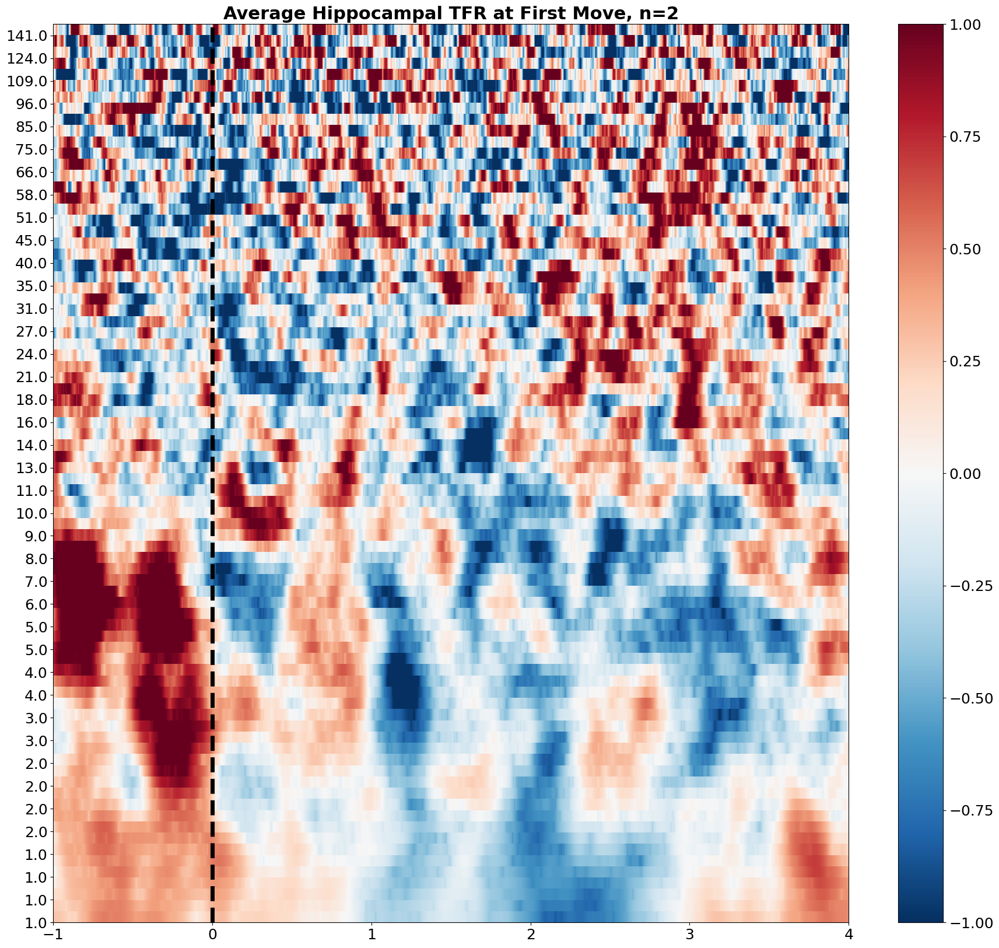

In [12]:
# Plot TFR
pf.plot_average_tfr(roi_tfr, f"Average Hippocampal TFR at First Move, n={len(hc_list)}", subject, 'hc_firstmove')


## Individual Channels

/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


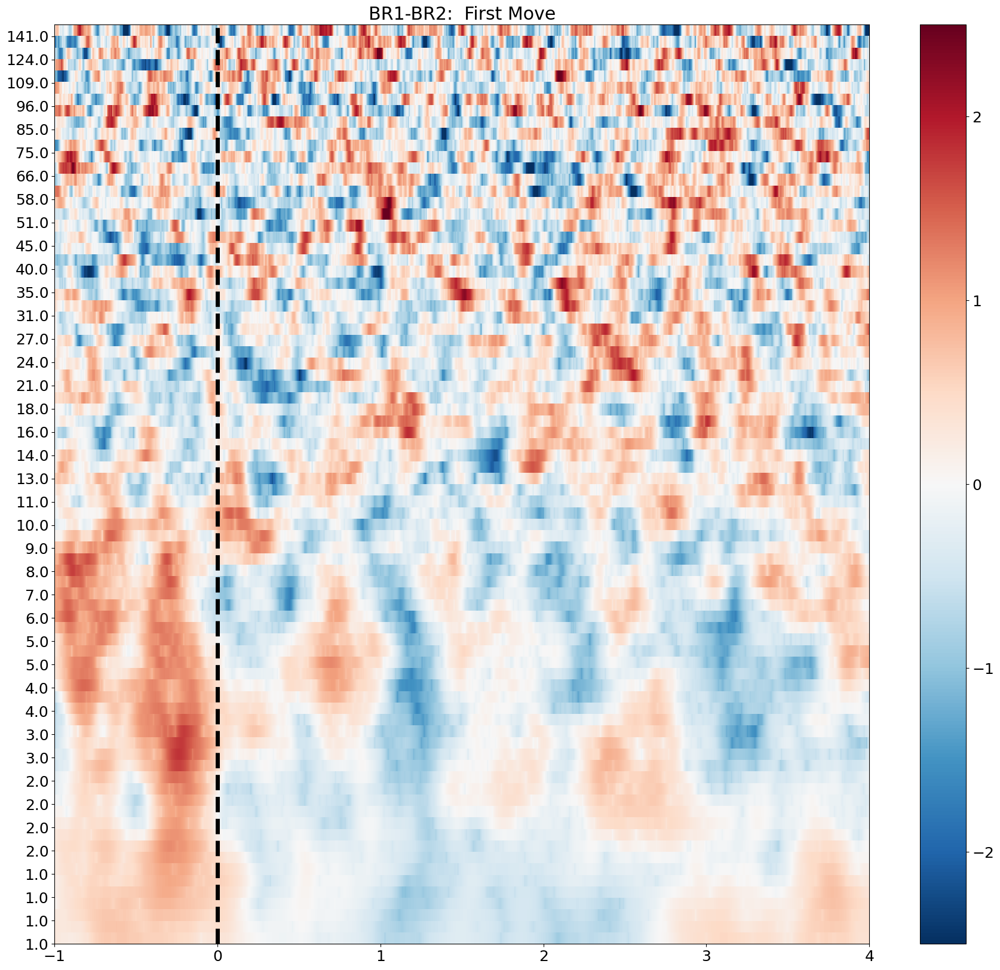

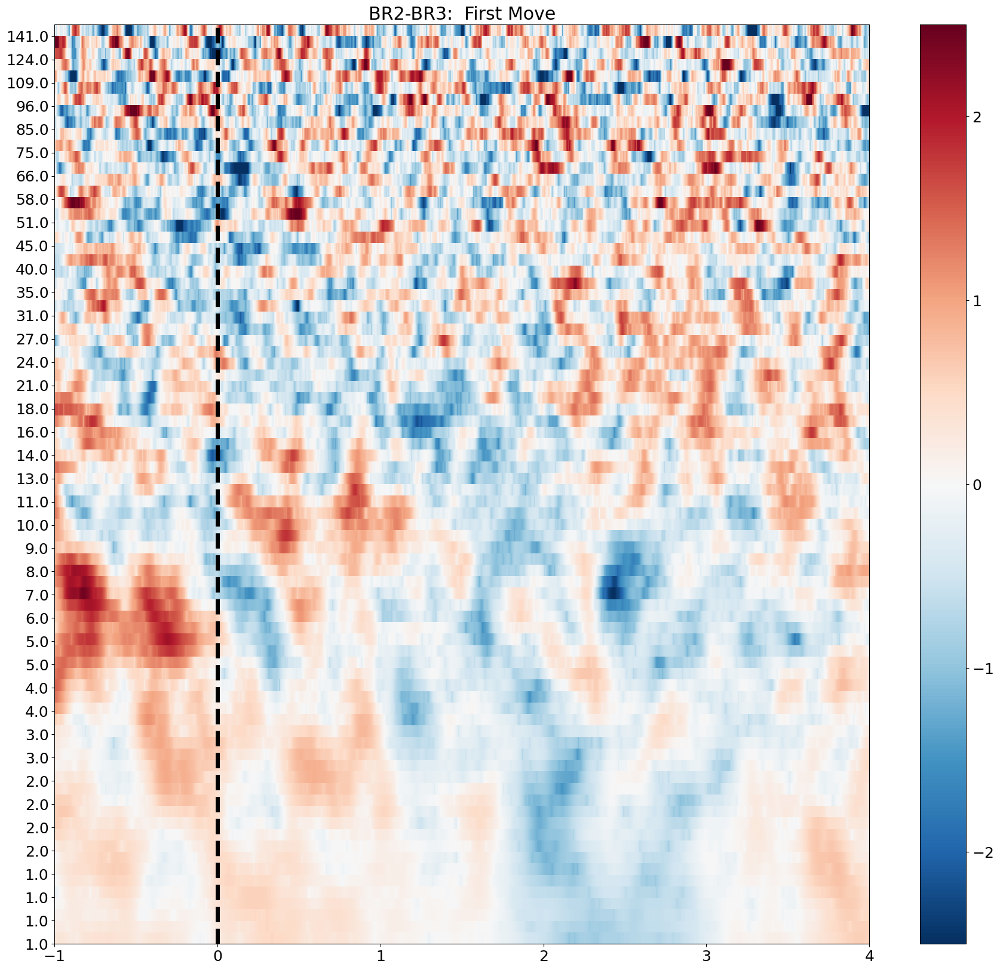

In [13]:
# Plot Channel TFR
for chix, ch in enumerate(roi_tfr.ch_names):

    pf.plot_channel_tfr(roi_tfr, chix, ch, 'First Move')
    


In [14]:
# save TFRs

roi_tfr["TrialType <= 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/ghost-hc-tfr.h5", overwrite = True)
roi_tfr["TrialType > 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/noghost-hc-tfr.h5", overwrite = True)




# OFC

In [15]:
ofc_list

['LL1-LL2',
 'LL2-LL3',
 'LL3-LL4',
 'LL4-LL5',
 'LL5-LL6',
 'LL6-LL7',
 'LL7-LL8',
 'LL8-LL9',
 'LL9-LL10',
 'LL10-LL11',
 'LL11-LL12']

In [16]:
# only roi of interest
first_move_roi = first_move_epochs.copy().pick_channels(ofc_list)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [17]:
# Resample to 1000 
if first_move_roi.info['sfreq'] > 1000:
    first_move_roi= first_move_roi.resample(1000)

In [18]:
# compute TRF

roi_tfr = []
roi_tfr = pf.compute_TFR(first_move_roi,pf.freqs,pf.n_cycles)

computing TFR
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=8)]: Done   7 out of  11 | elapsed:  1.7min remaining:   59.6s


[Parallel(n_jobs=8)]: Done  11 out of  11 | elapsed:  2.4min finished


In [19]:
roi_tfr.crop(tmin = -1, tmax = 4)


Data type,Power Estimates
Data source,Epochs
Number of epochs,159
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,11
Number of timepoints,5001
Number of frequency bins,80
Frequency range,1.00 – 150.00 Hz


In [20]:
# Log and zscore

roi_tfr = pf.log_and_zscore_TFR(roi_tfr, baseline = (-1,4), logflag=True)

log transforming


z-scoring to baseline


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:145: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


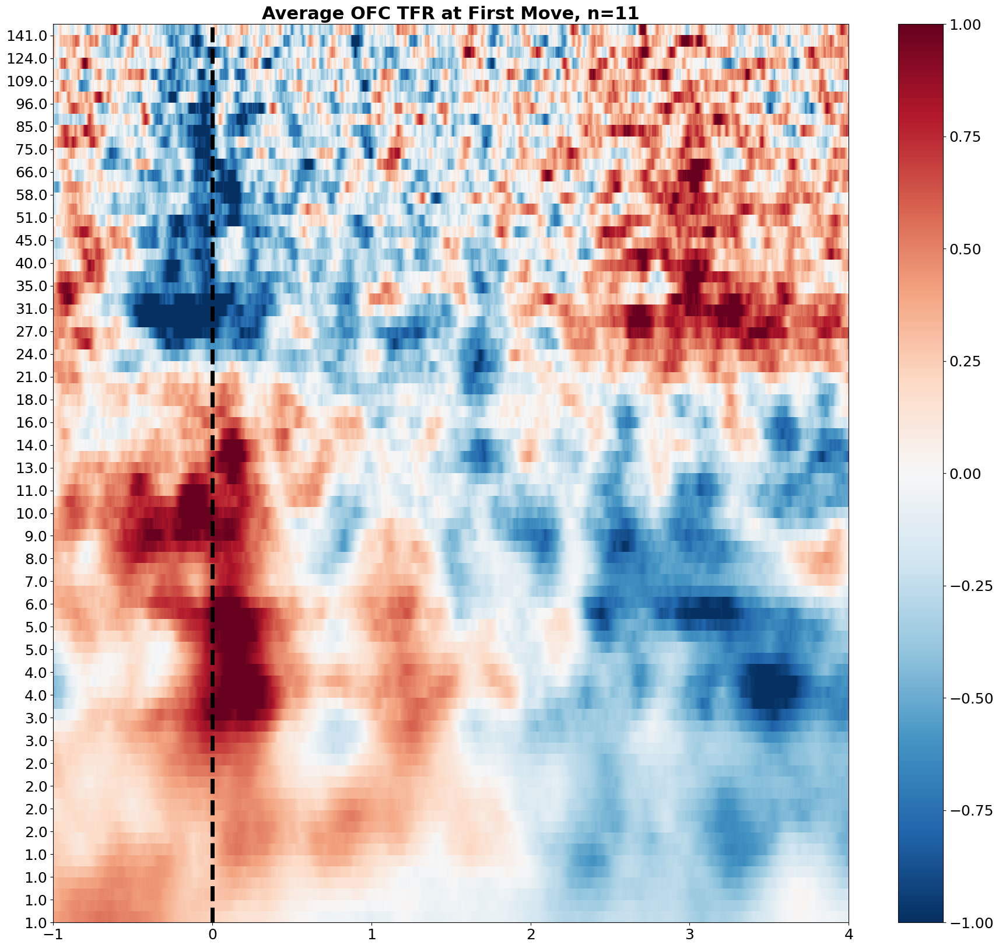

In [21]:
# Plot TFR
pf.plot_average_tfr(roi_tfr, f"Average OFC TFR at First Move, n={len(ofc_list)}", subject, 'ofc_firstmove')


### Individual Channels

/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


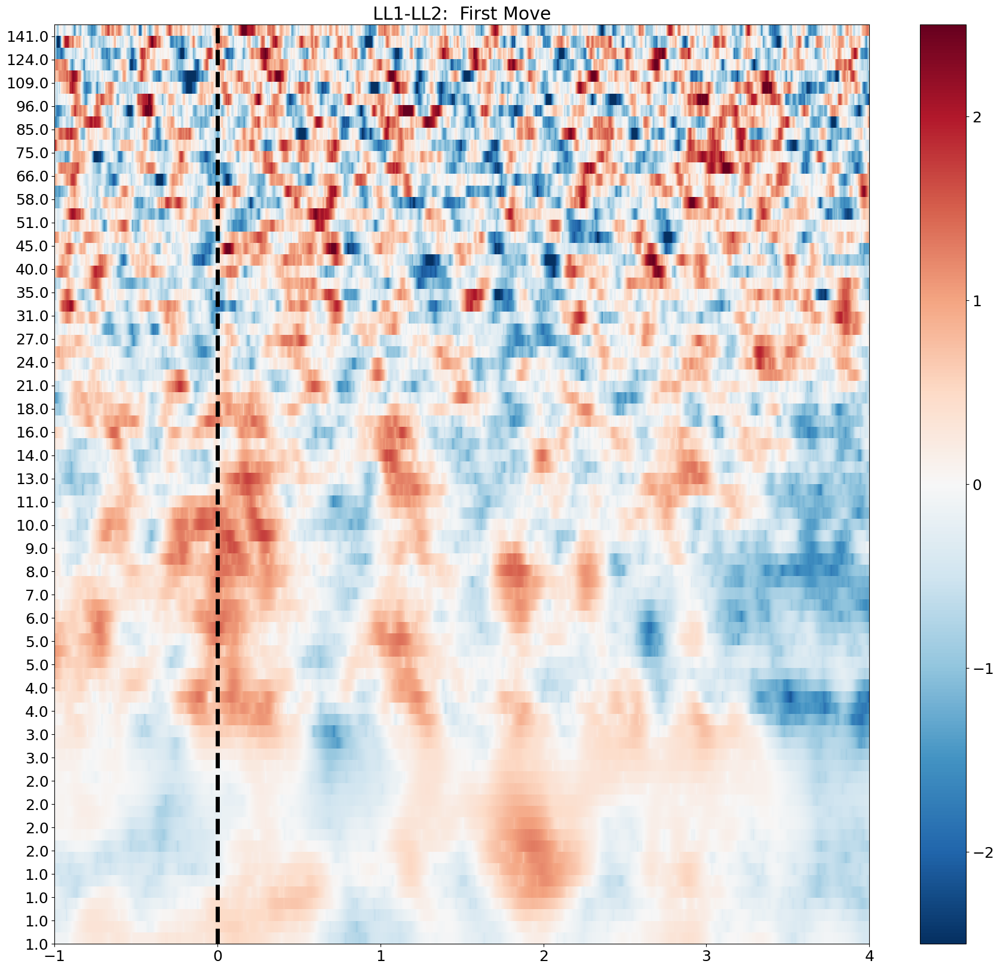

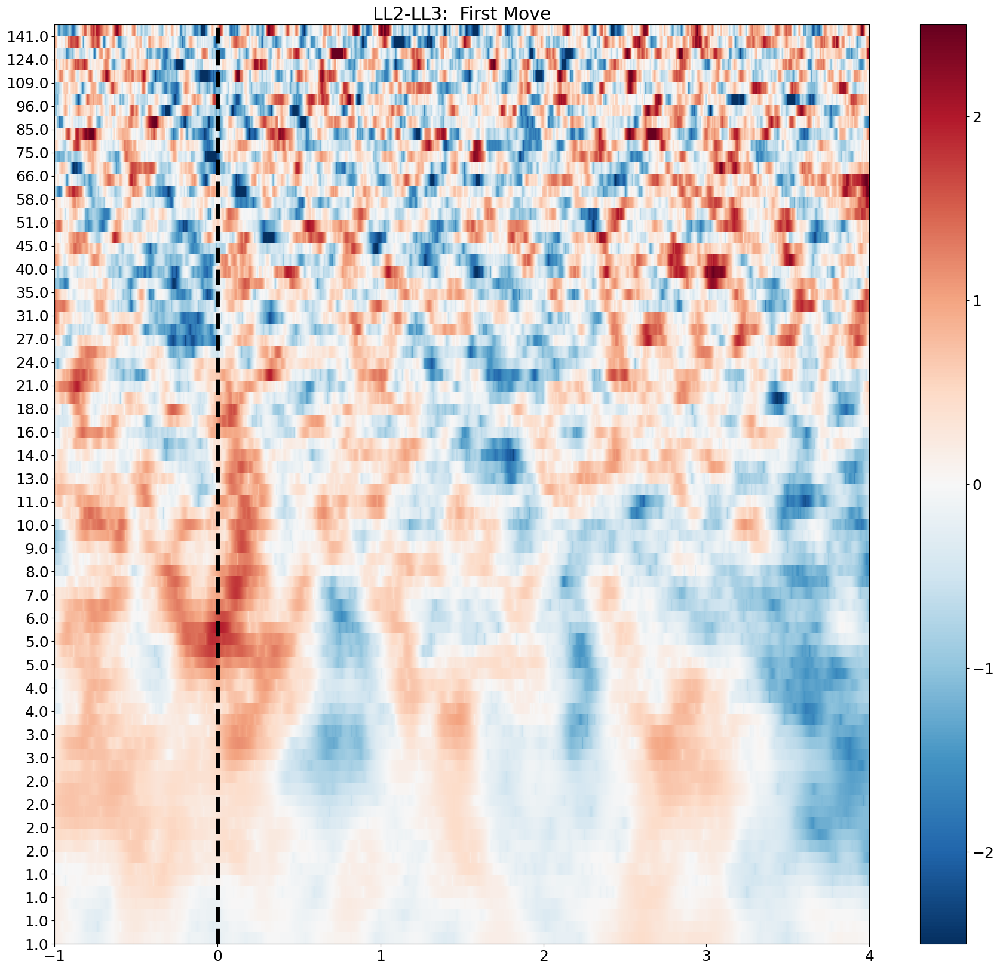

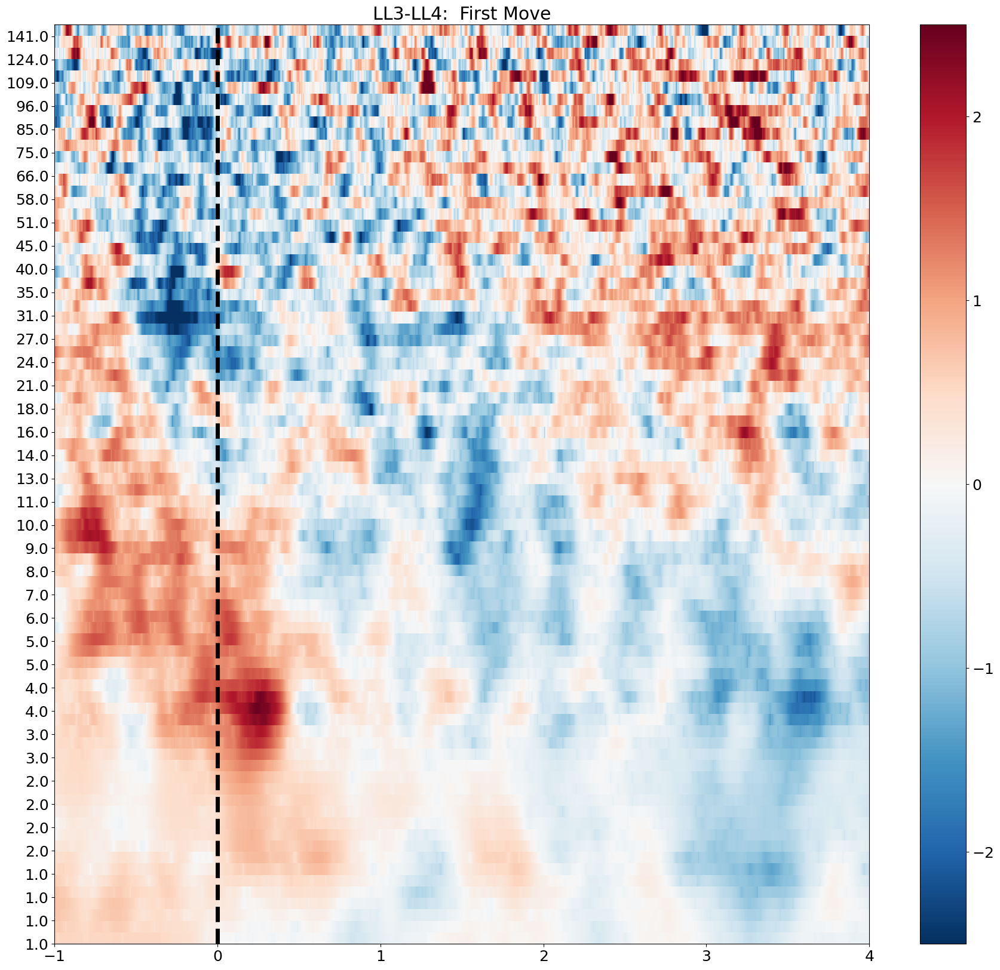

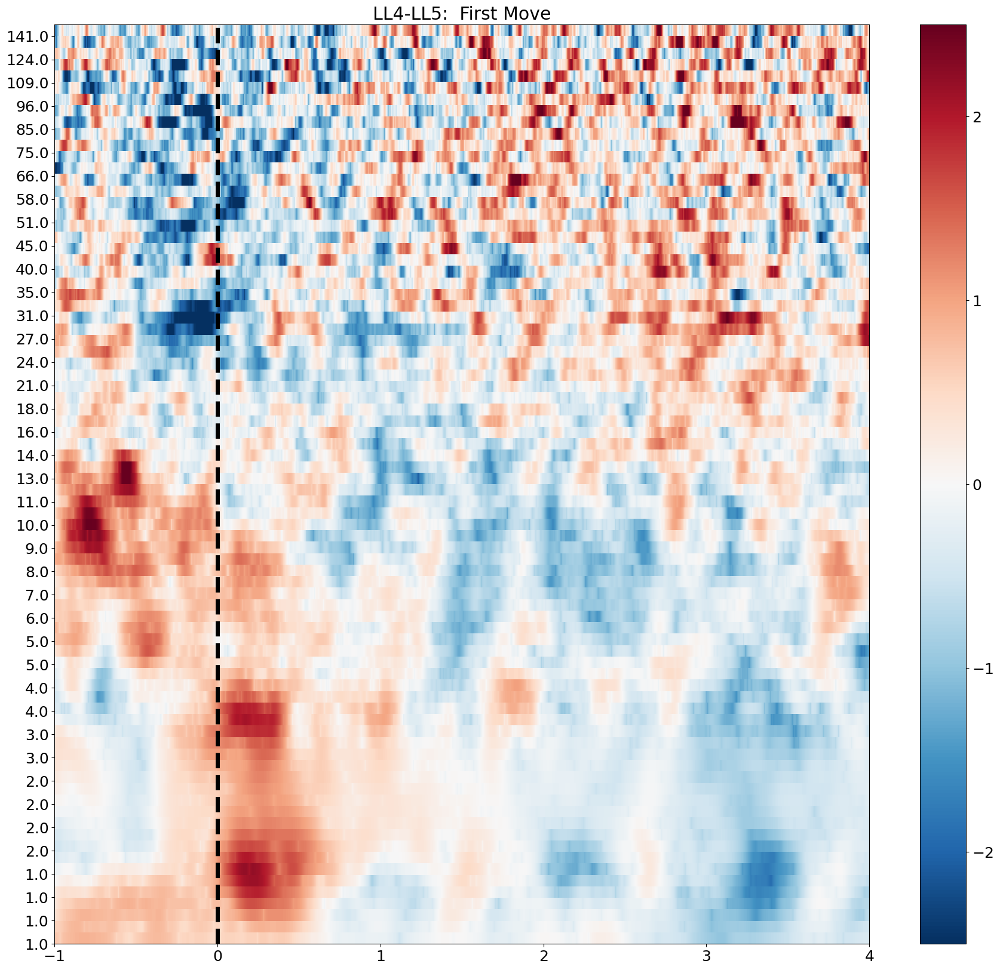

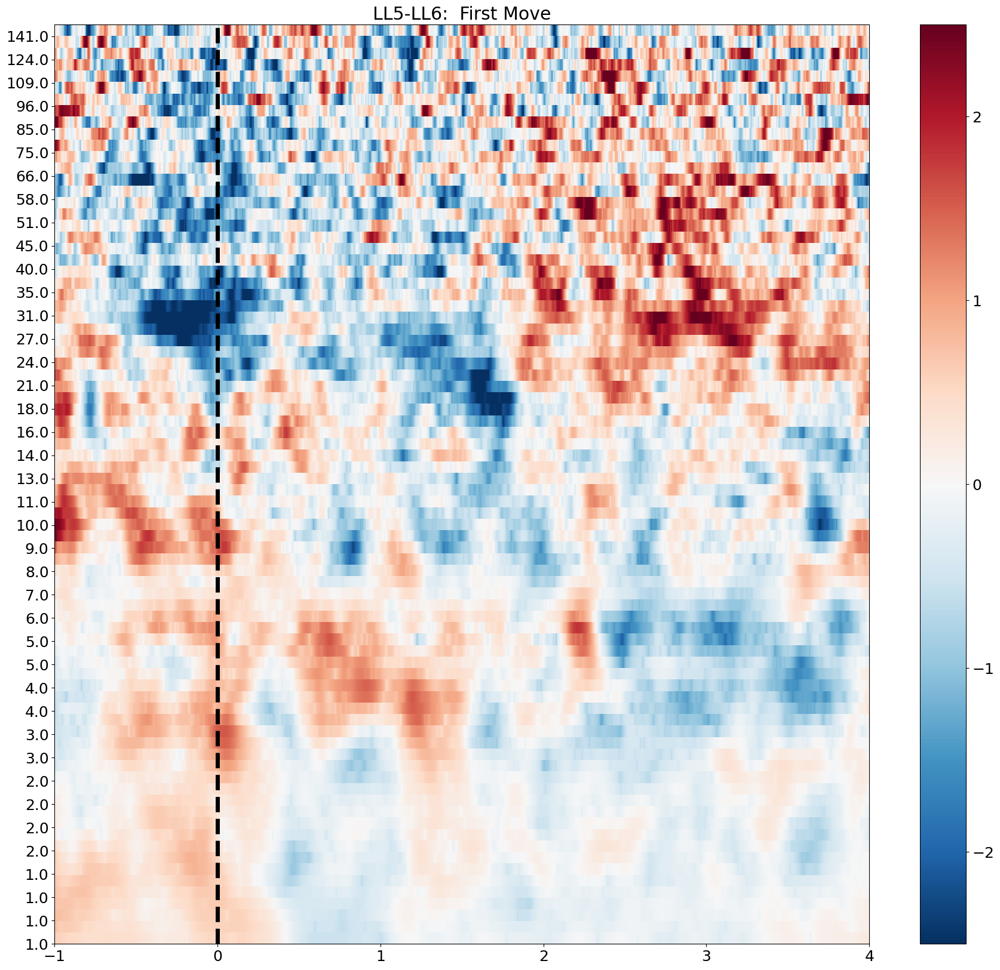

...

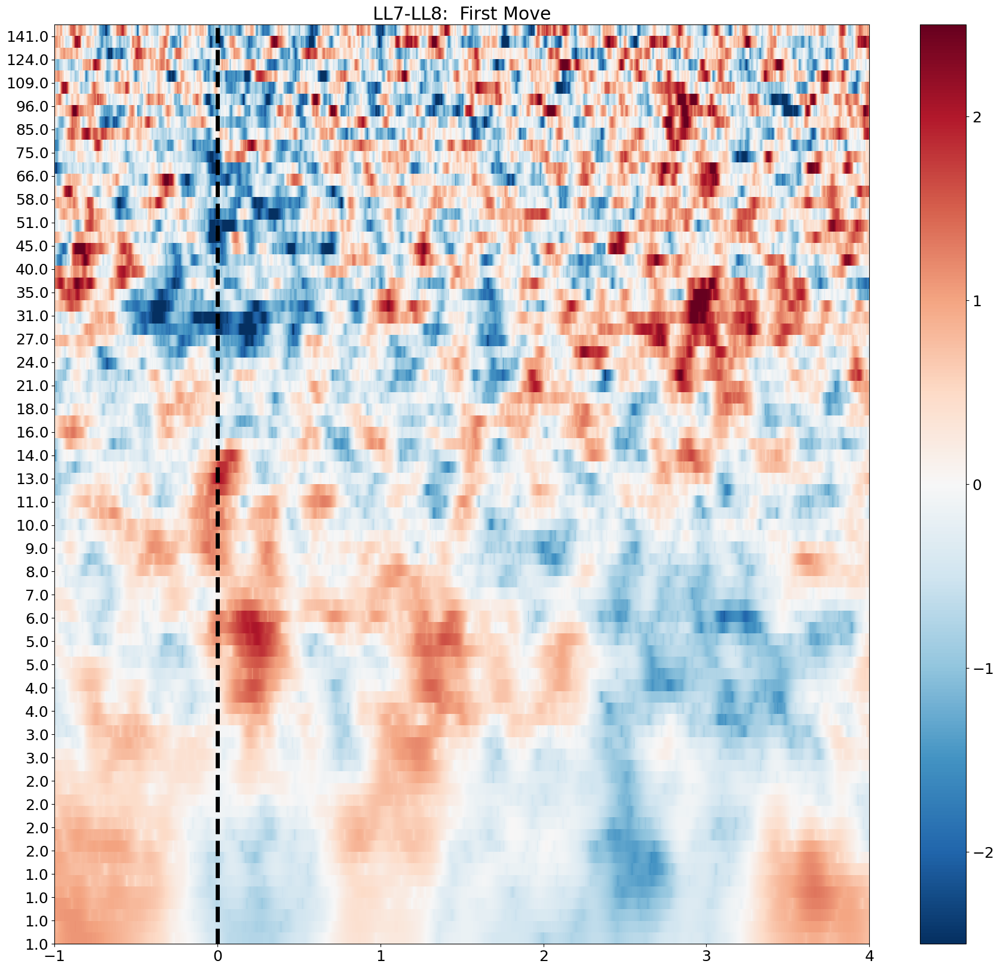

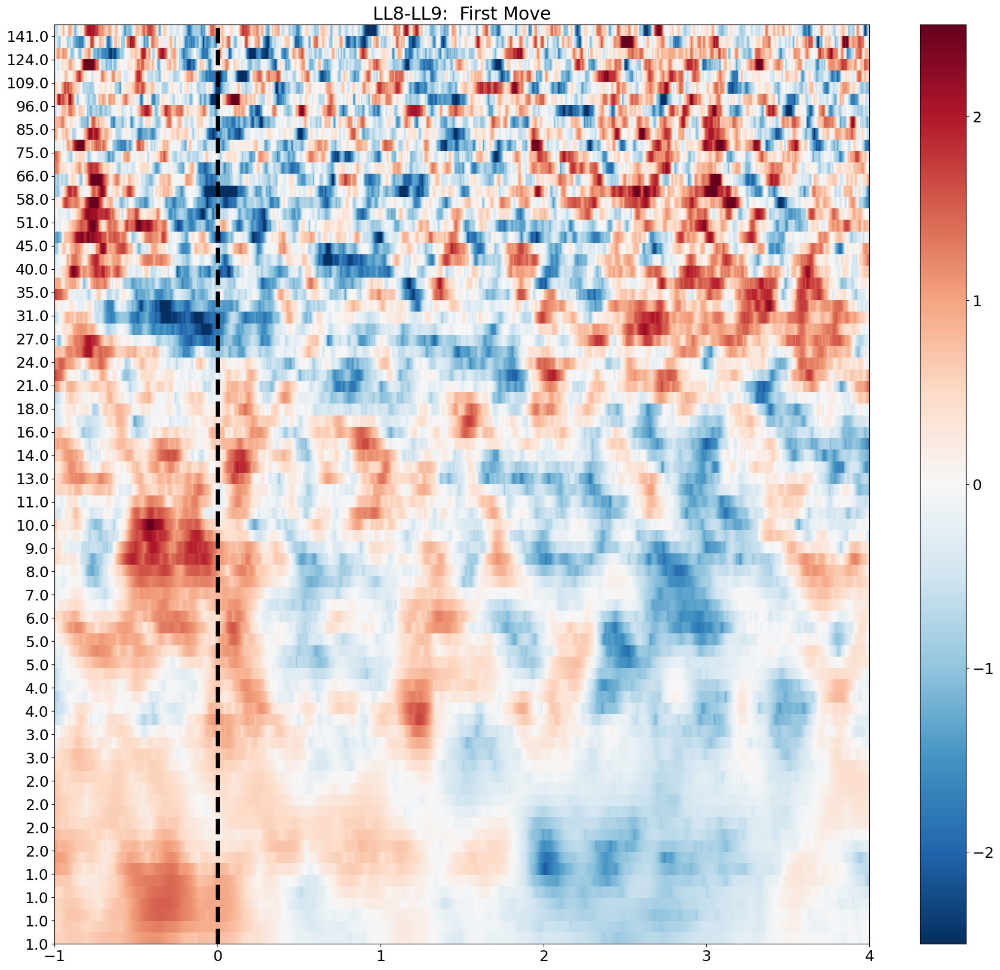

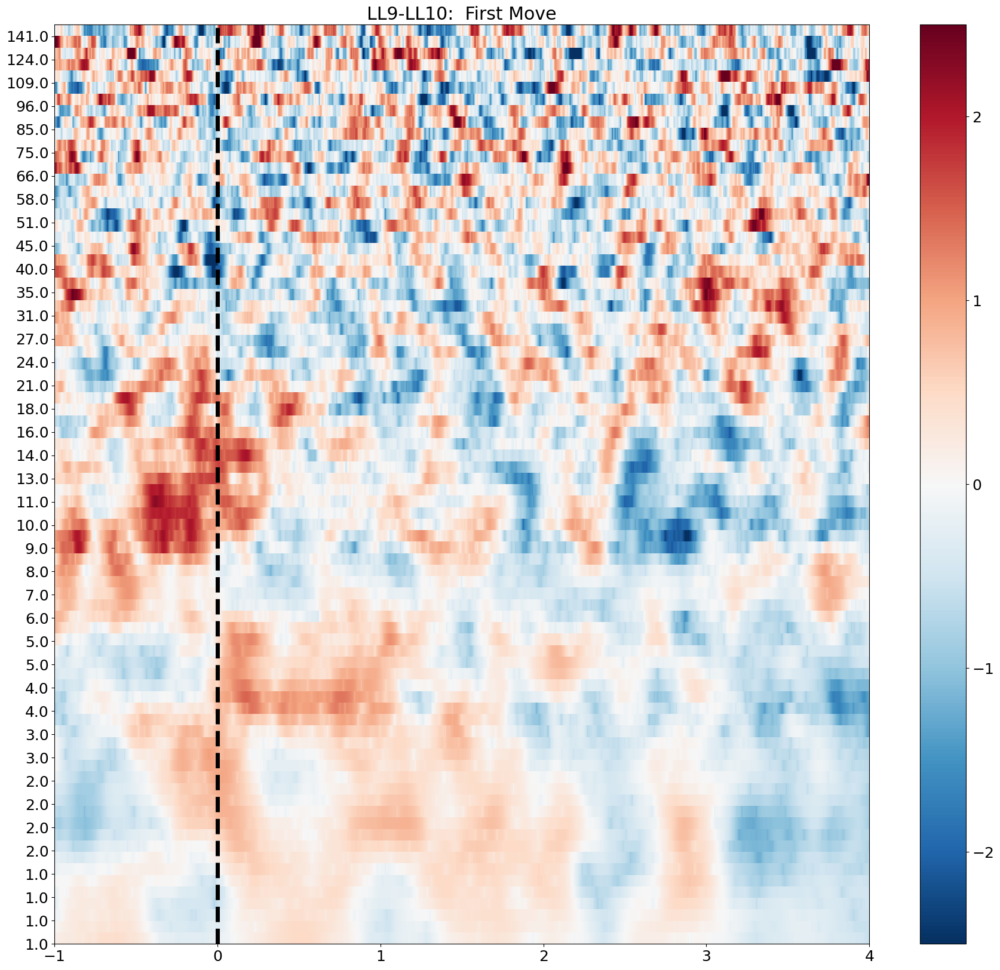

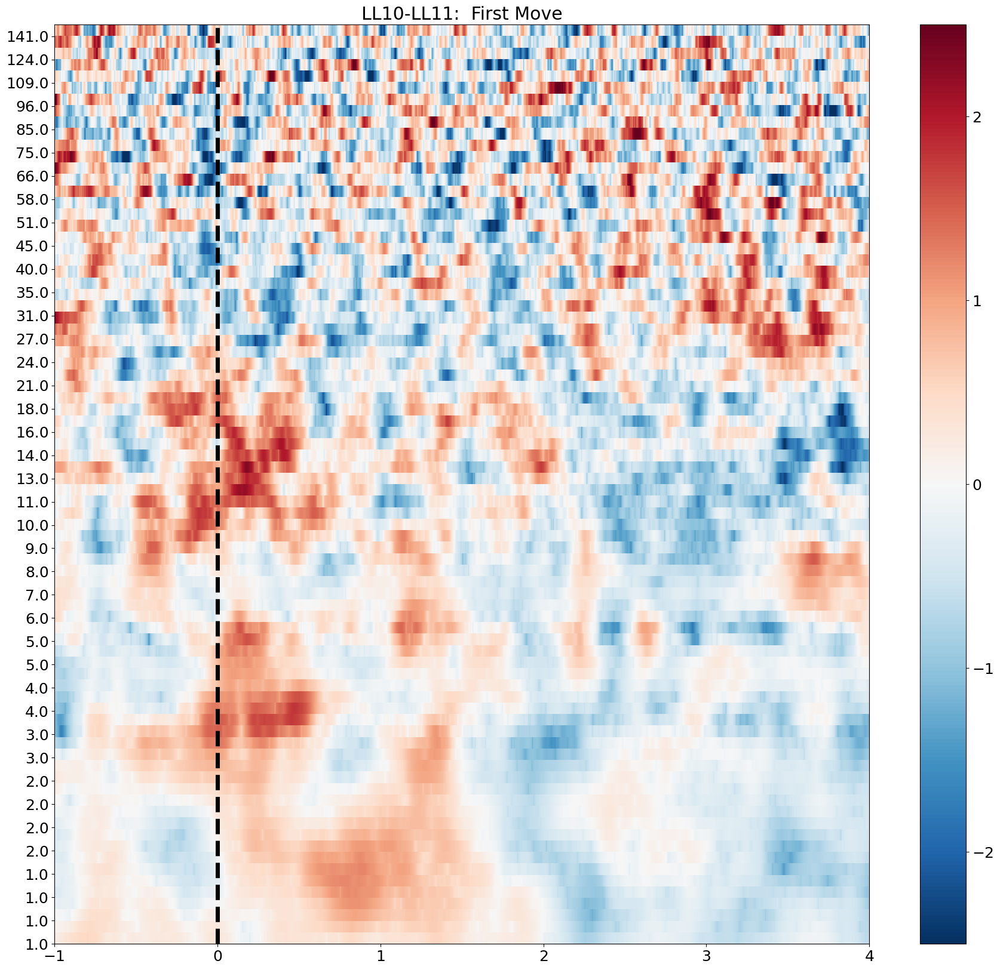

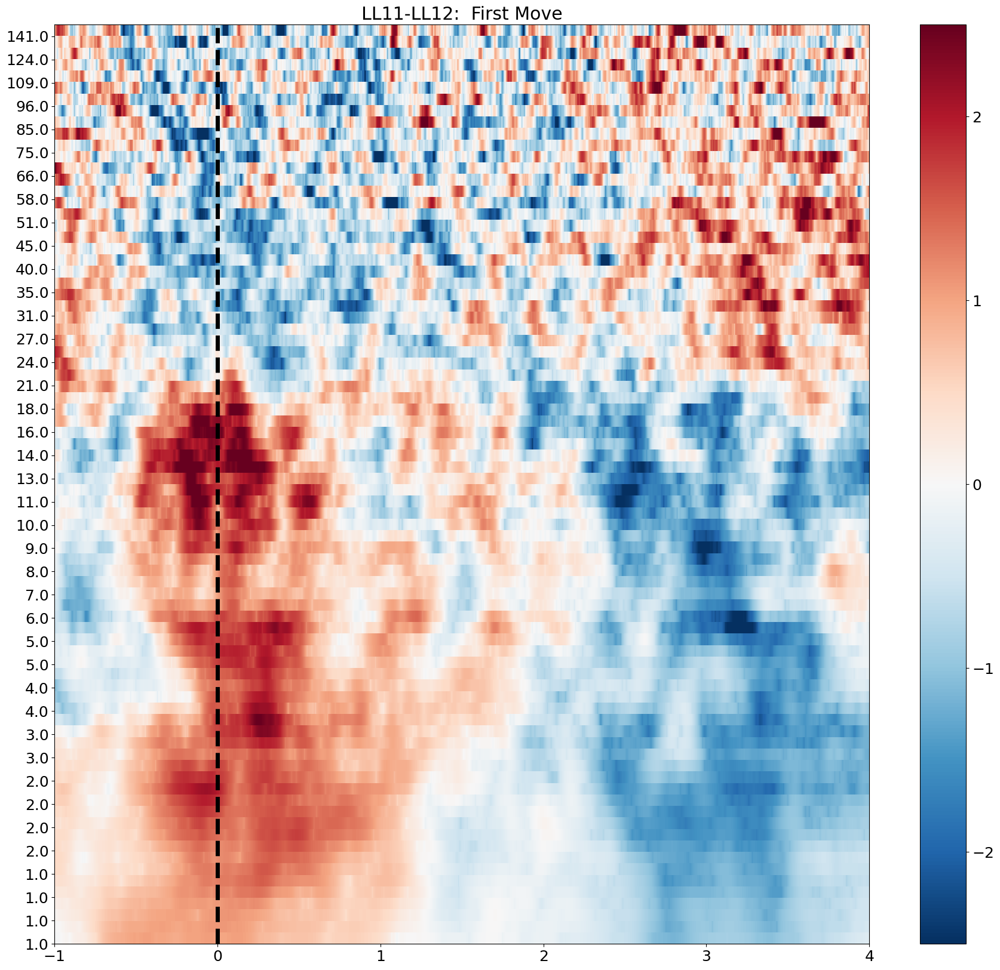

In [22]:
# Plot Channel TFR
for chix, ch in enumerate(roi_tfr.ch_names):

    pf.plot_channel_tfr(roi_tfr, chix, ch, 'First Move')

In [23]:
# save TFRs

roi_tfr["TrialType <= 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/ghost-ofc-tfr.h5", overwrite = True)
roi_tfr["TrialType > 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/noghost-ofc-tfr.h5", overwrite = True)


# Amygdala

In [24]:
amyg_list

['AL5-AL6', 'AL6-AL7', 'AR1-AR2', 'AR2-AR3', 'AR3-AR4']

In [25]:
# only roi 
first_move_roi = first_move_epochs.copy().pick_channels(amyg_list)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [26]:
# Resample to 1000 
if first_move_roi.info['sfreq'] > 1000:
    first_move_roi= first_move_roi.resample(1000)

In [27]:
# compute TRF

roi_tfr = []
roi_tfr = pf.compute_TFR(first_move_roi,pf.freqs,pf.n_cycles)


computing TFR
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=8)]: Done   2 out of   5 | elapsed:  1.1min remaining:  1.7min


[Parallel(n_jobs=8)]: Done   5 out of   5 | elapsed:  1.3min finished


In [28]:
roi_tfr.crop(tmin = -1, tmax = 4)


Data type,Power Estimates
Data source,Epochs
Number of epochs,159
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,5
Number of timepoints,5001
Number of frequency bins,80
Frequency range,1.00 – 150.00 Hz


In [29]:
# Log and zscore

roi_tfr = pf.log_and_zscore_TFR(roi_tfr, baseline = (-1,4), logflag=True)

log transforming


z-scoring to baseline


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:145: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


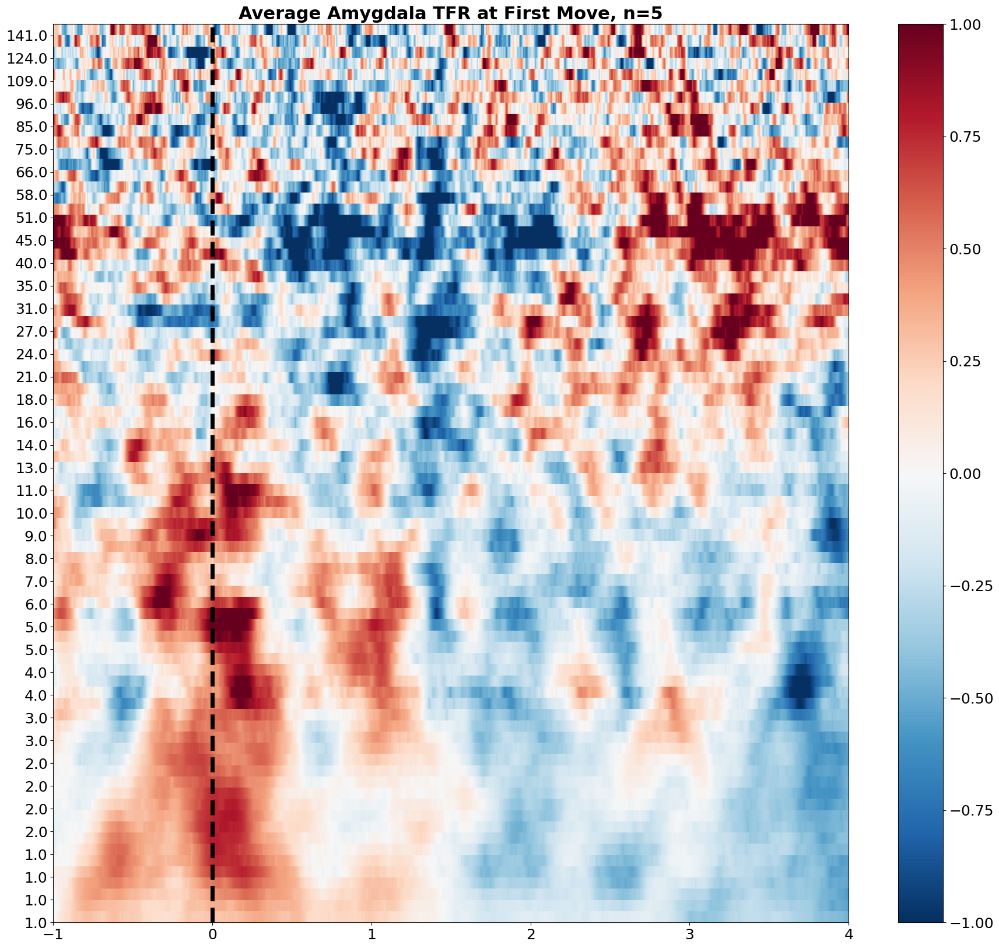

In [30]:
# Plot TFR
pf.plot_average_tfr(roi_tfr, f"Average Amygdala TFR at First Move, n={len(amyg_list)}", subject, 'amyg_firstmove')

### Individual Channels

/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


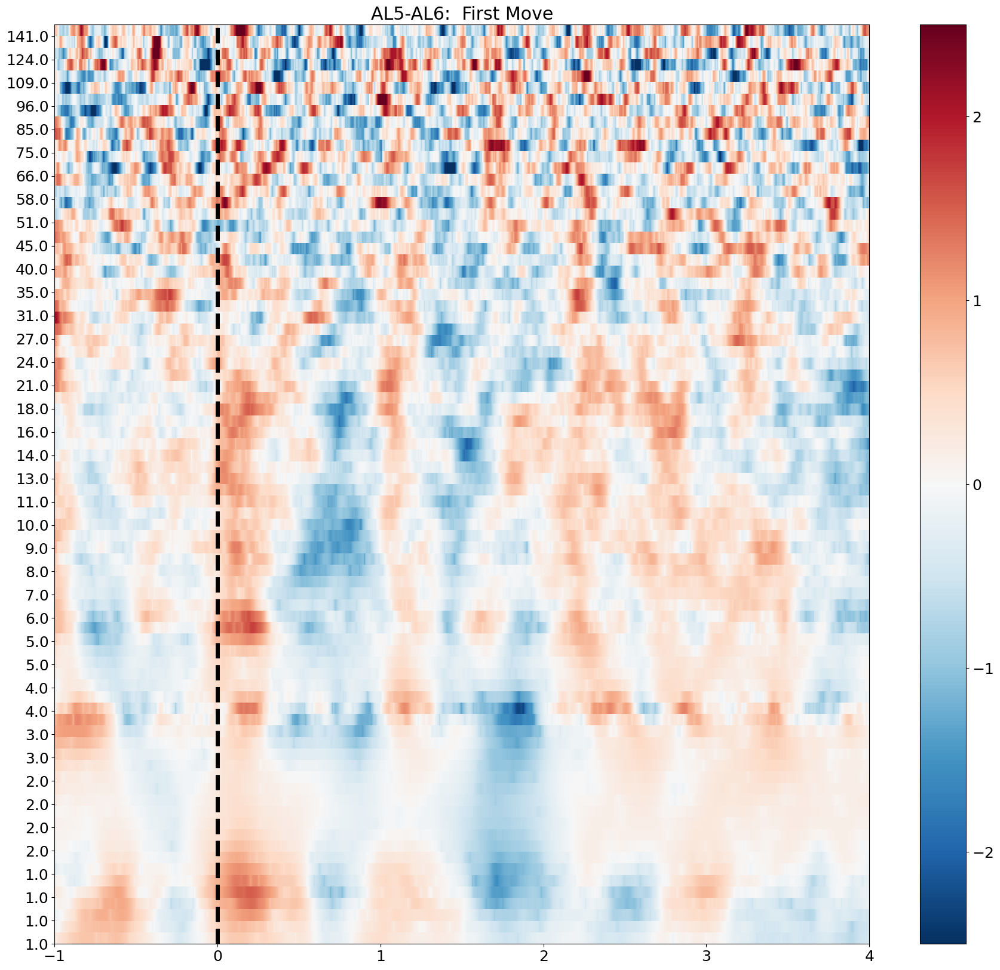

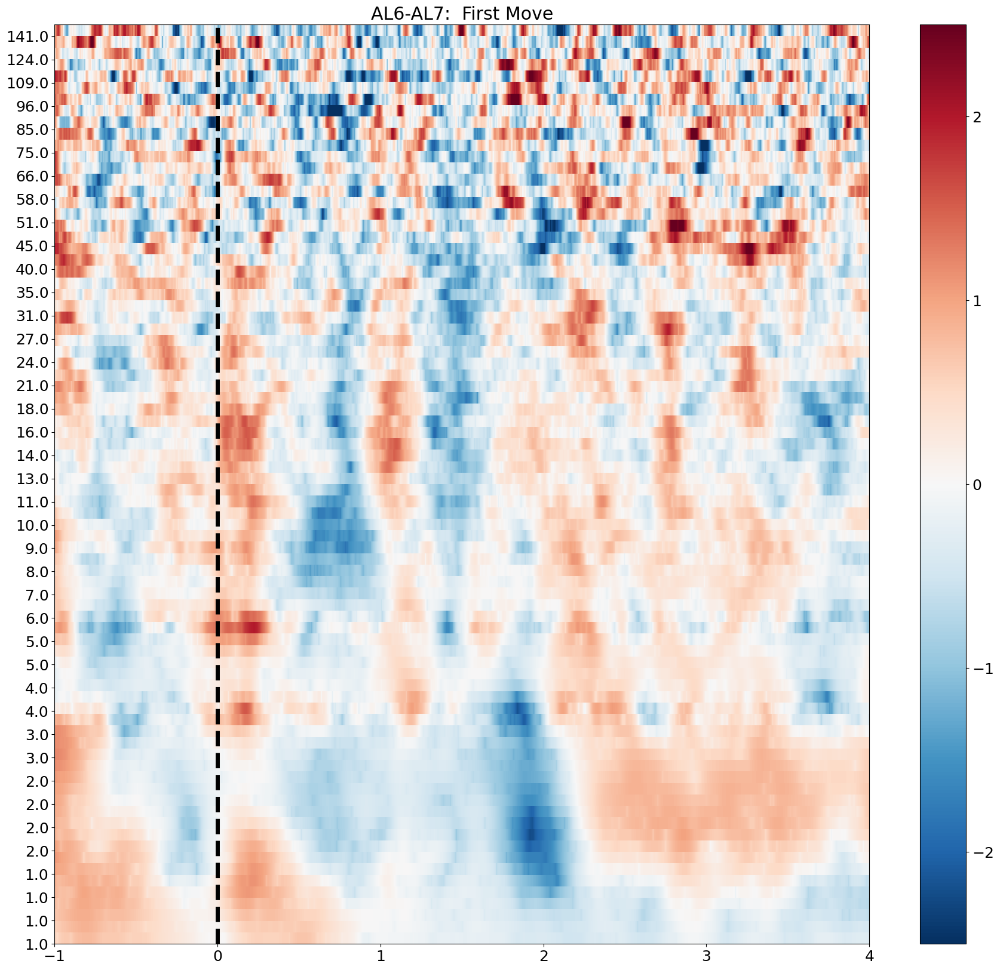

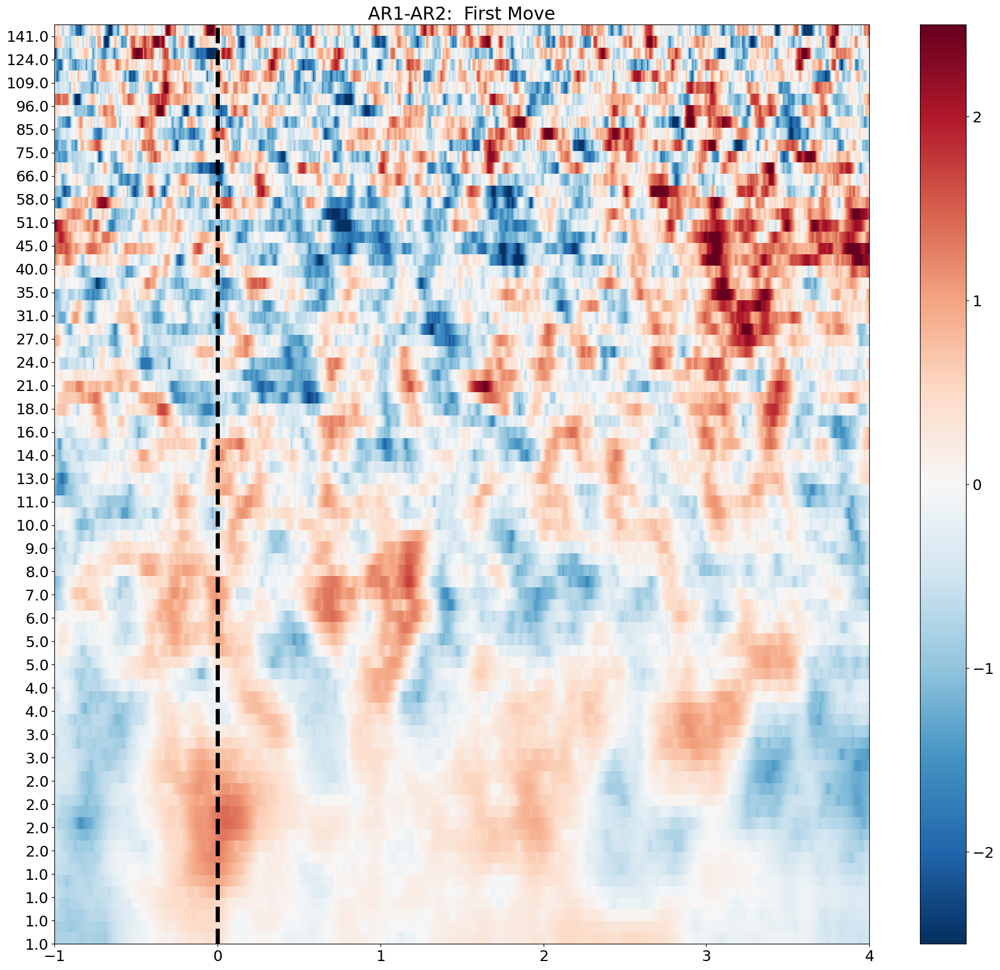

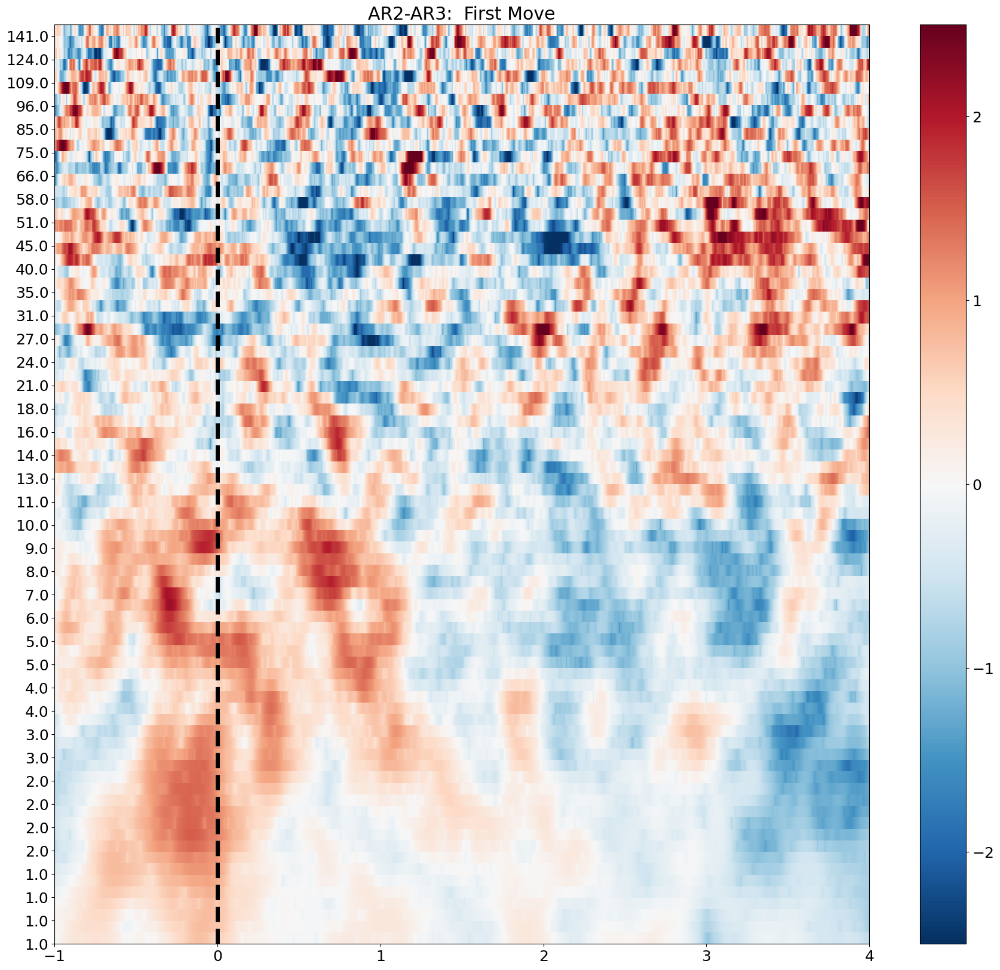

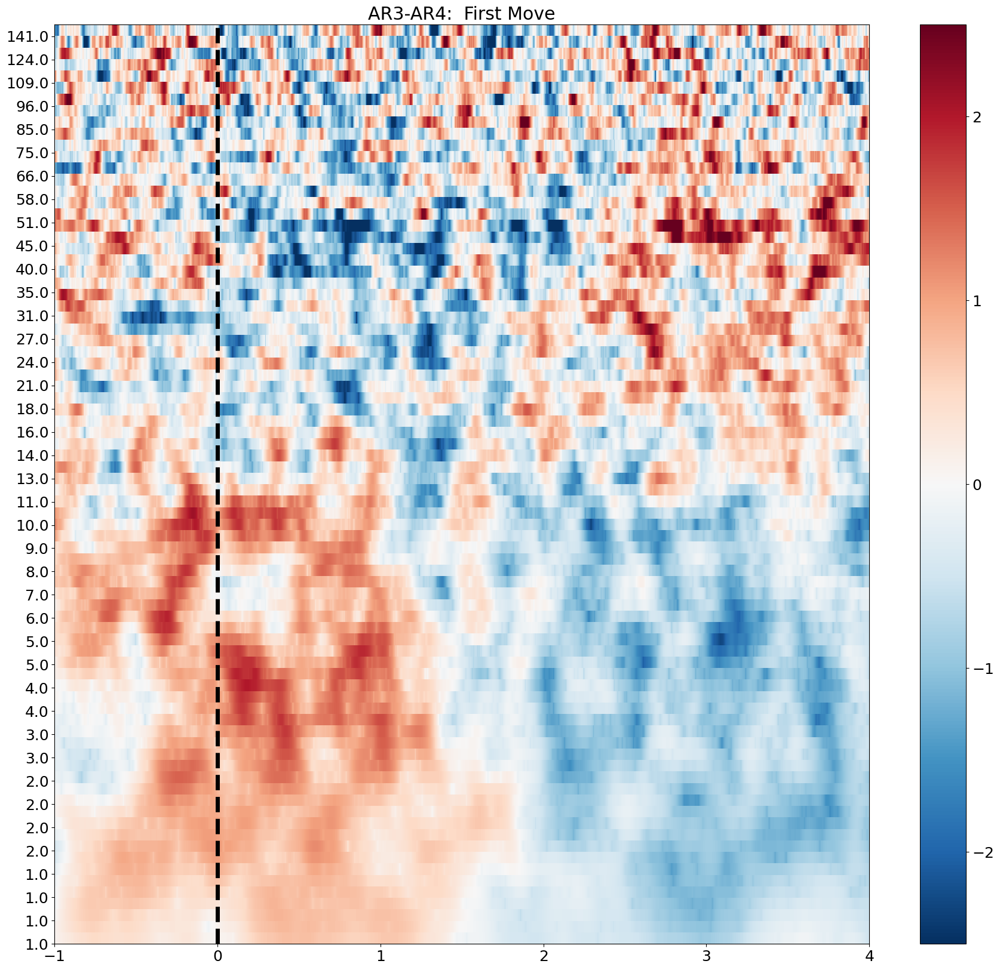

In [31]:
# Plot Channel TFR
for chix, ch in enumerate(roi_tfr.ch_names):

    pf.plot_channel_tfr(roi_tfr, chix, ch, 'First Move')

In [32]:
# save TFRs

roi_tfr["TrialType <= 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/ghost-amyg-tfr.h5", overwrite = True)
roi_tfr["TrialType > 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/noghost-amyg-tfr.h5", overwrite = True)


## Cingulate

In [33]:
cing_list

['ML1-ML2']

In [34]:
# only roi 
first_move_roi = first_move_epochs.copy().pick_channels(cing_list)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [35]:
# Resample to 1000 
if first_move_roi.info['sfreq'] > 1000:
    first_move_roi= first_move_roi.resample(1000)

In [36]:
# compute TRF

roi_tfr = []
roi_tfr = pf.compute_TFR(first_move_roi,pf.freqs,pf.n_cycles)


computing TFR
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.


In [37]:
roi_tfr.crop(tmin = -1, tmax = 4)


Data type,Power Estimates
Data source,Epochs
Number of epochs,159
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,1
Number of timepoints,5001
Number of frequency bins,80
Frequency range,1.00 – 150.00 Hz


In [38]:
# Log and zscore

roi_tfr = pf.log_and_zscore_TFR(roi_tfr, baseline = (-1,4), logflag=True)

log transforming


z-scoring to baseline


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:145: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


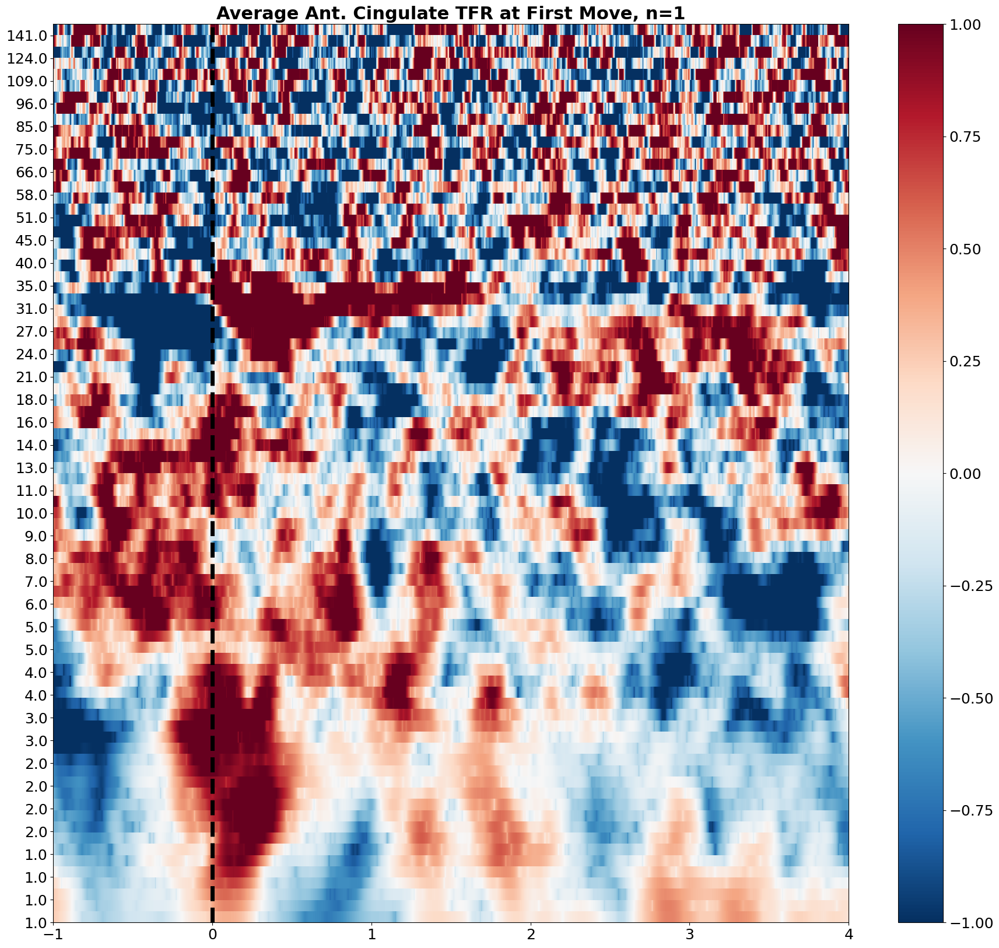

In [39]:
# Plot TFR
pf.plot_average_tfr(roi_tfr, f"Average Ant. Cingulate TFR at First Move, n={len(cing_list)}", subject, 'cing_firstmove')

### Individual Channels

/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


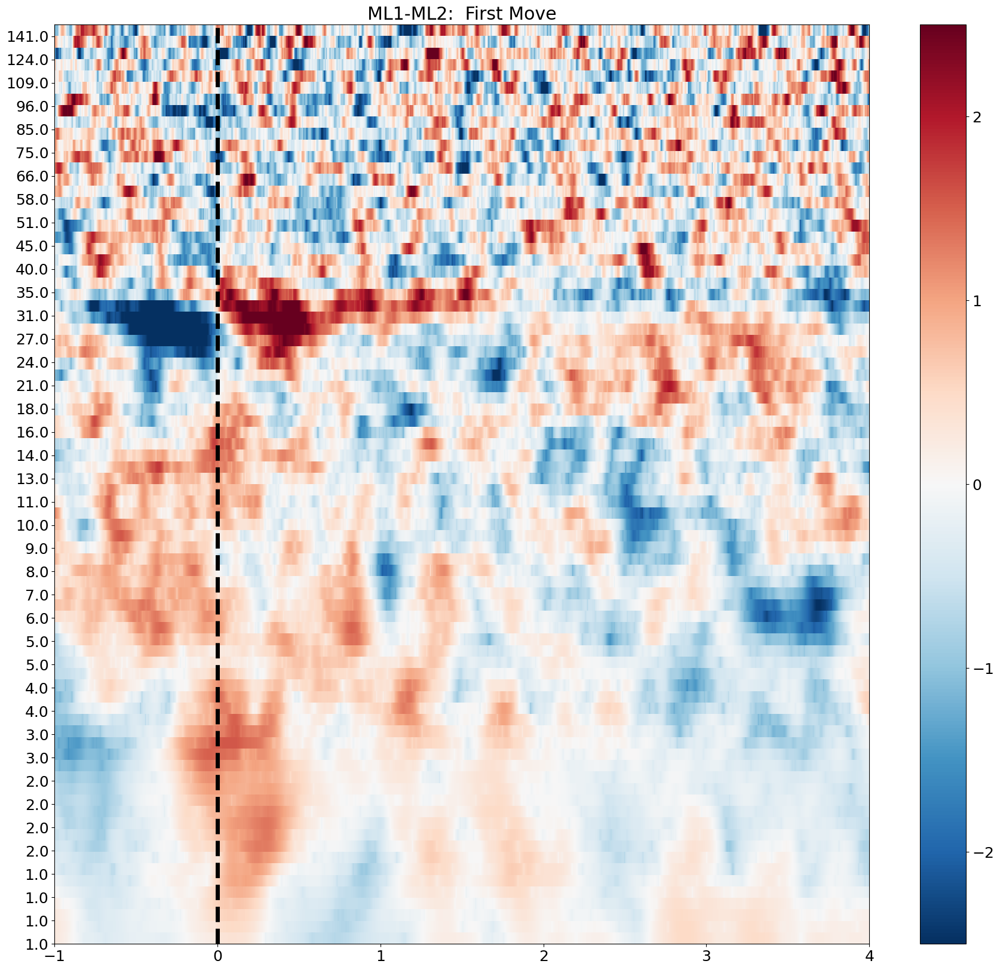

In [40]:
# Plot Channel TFR
for chix, ch in enumerate(roi_tfr.ch_names):

    pf.plot_channel_tfr(roi_tfr, chix, ch, 'First Move')

In [41]:
# save TFRs

roi_tfr["TrialType <= 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/ghost-cing-tfr.h5", overwrite = True)
roi_tfr["TrialType > 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/noghost-cing-tfr.h5", overwrite = True)


# Control Regions

## Insula

In [42]:
insula_list

['IL3-IL4',
 'IL4-IL5',
 'IL5-IL6',
 'JL3-JL4',
 'JL4-JL5',
 'JL5-JL6',
 'KL1-KL2',
 'KL2-KL3',
 'KL3-KL4',
 'KL4-KL5',
 'KL5-KL6',
 'KL6-KL7']

In [43]:
# Only ROI
first_move_roi = first_move_epochs.copy().pick_channels(insula_list)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [44]:
# Resample to 1000 
if first_move_roi.info['sfreq'] > 1000:
    first_move_roi= first_move_roi.resample(1000)

In [45]:
# compute TRF

roi_tfr = []
roi_tfr = pf.compute_TFR(first_move_roi,pf.freqs,pf.n_cycles)


computing TFR
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=8)]: Done   8 out of  12 | elapsed:  1.7min remaining:   51.6s


[Parallel(n_jobs=8)]: Done  12 out of  12 | elapsed:  2.5min finished


In [46]:
roi_tfr.crop(tmin = -1, tmax = 4)


Data type,Power Estimates
Data source,Epochs
Number of epochs,159
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,12
Number of timepoints,5001
Number of frequency bins,80
Frequency range,1.00 – 150.00 Hz


In [47]:
# Log and zscore

roi_tfr = pf.log_and_zscore_TFR(roi_tfr, baseline = (-1,4), logflag=True)

log transforming


z-scoring to baseline


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:145: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


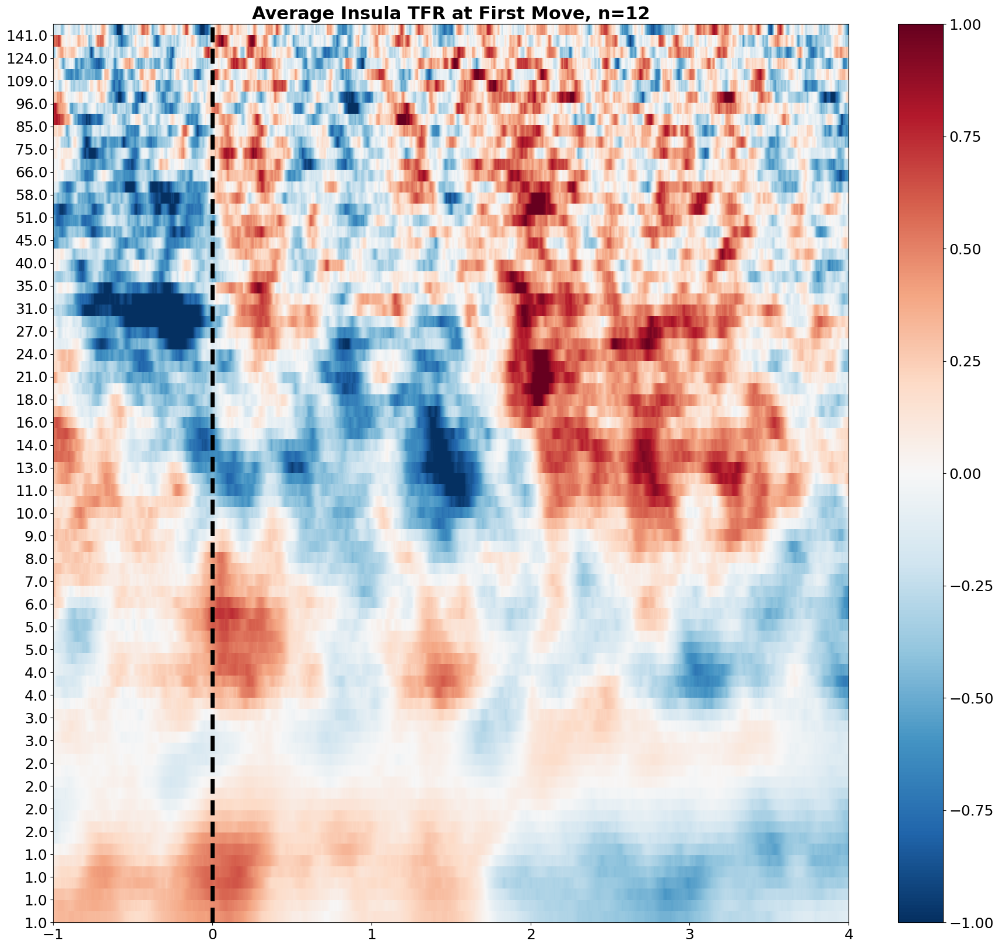

In [48]:
# Plot TFR
pf.plot_average_tfr(roi_tfr, f"Average Insula TFR at First Move, n={len(insula_list)}", subject, 'insula_firstmove')

### Individual Channels

/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


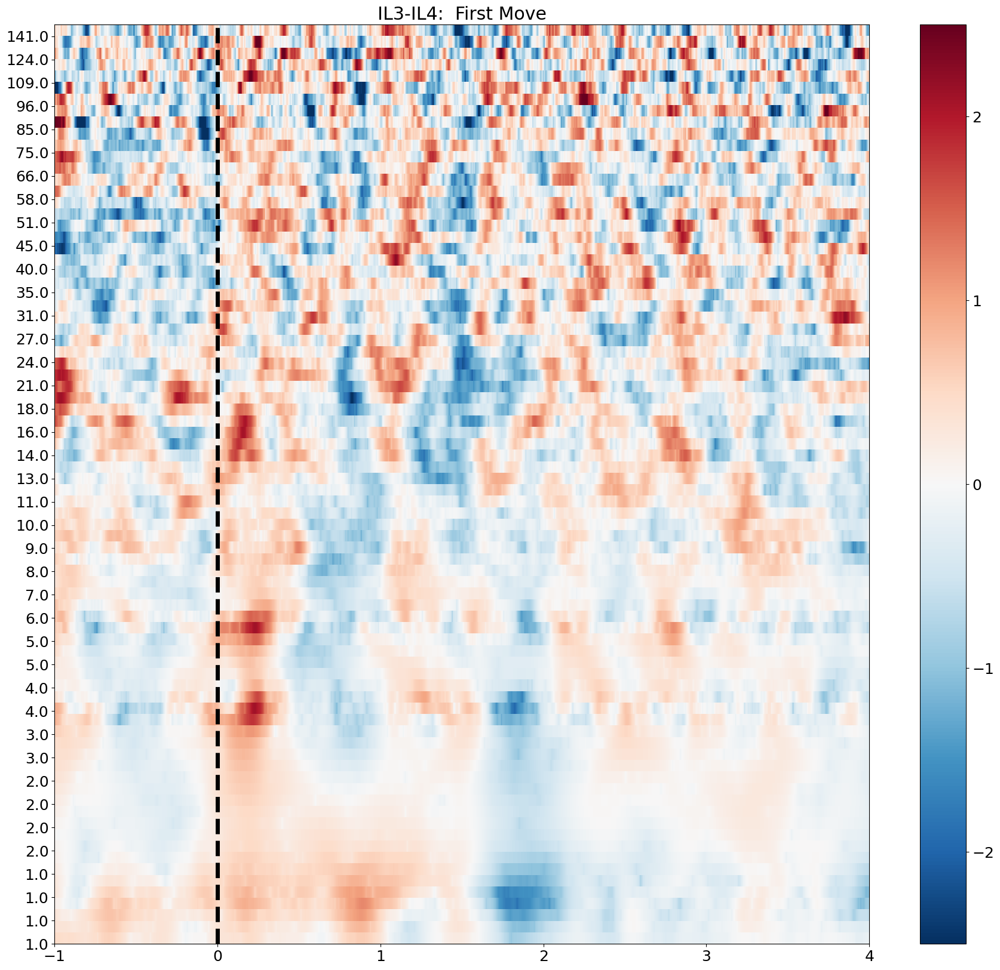

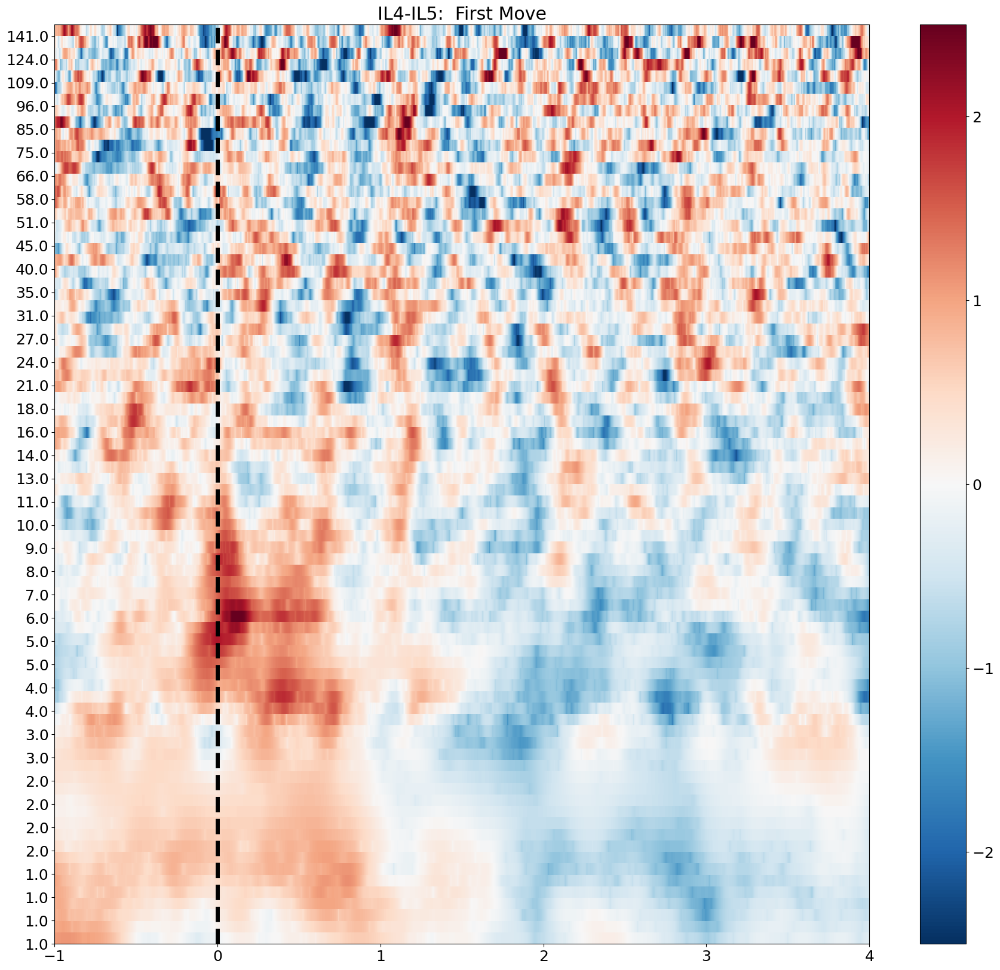

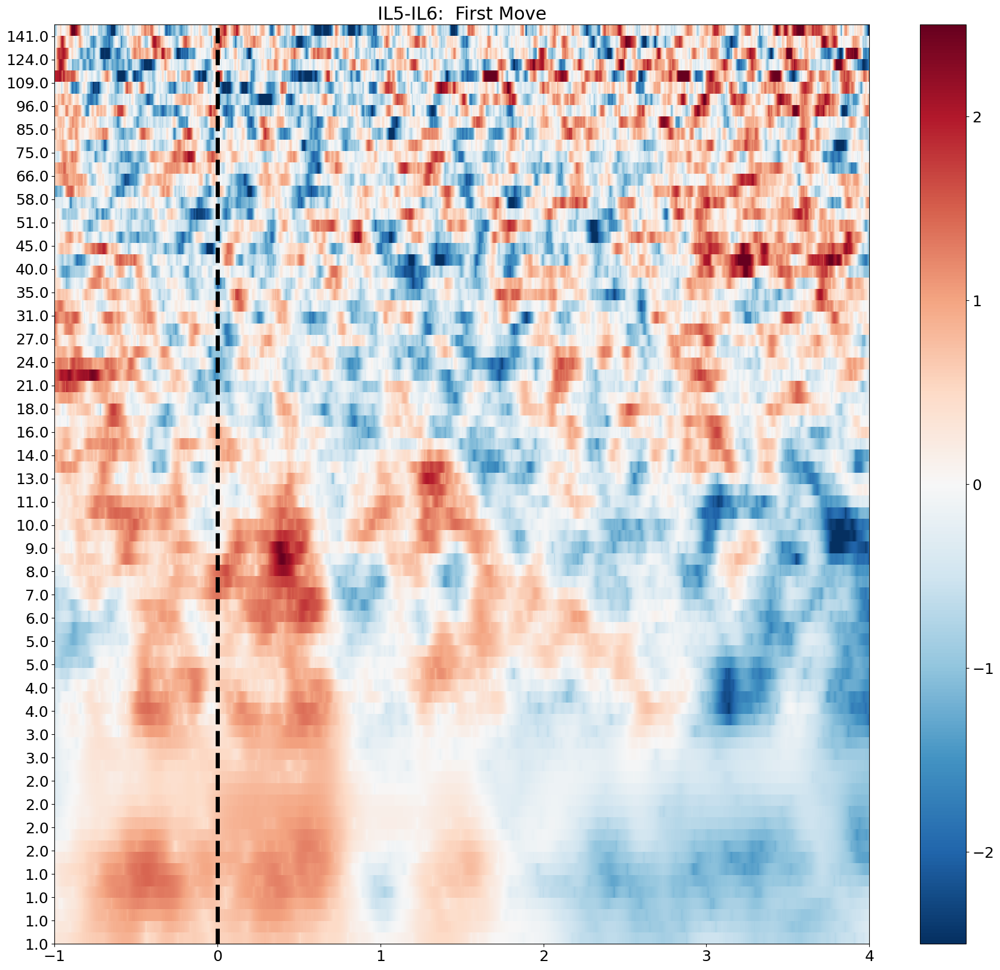

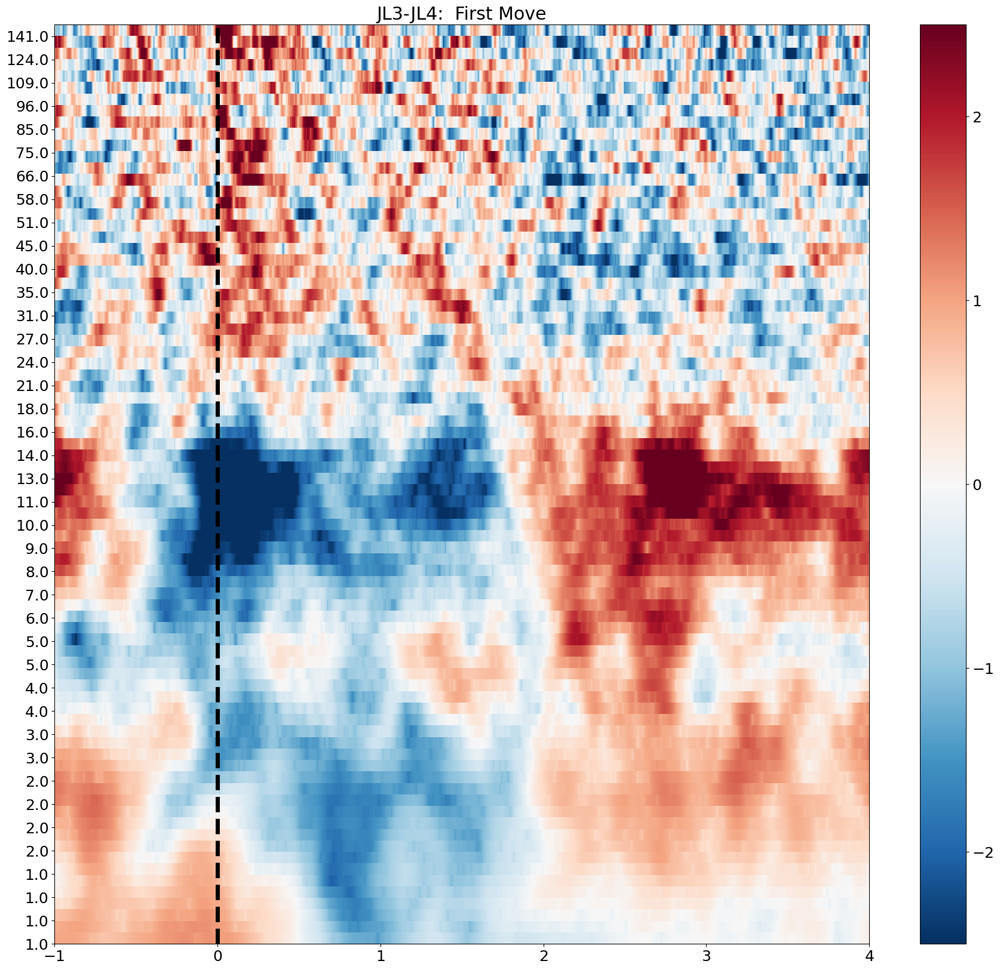

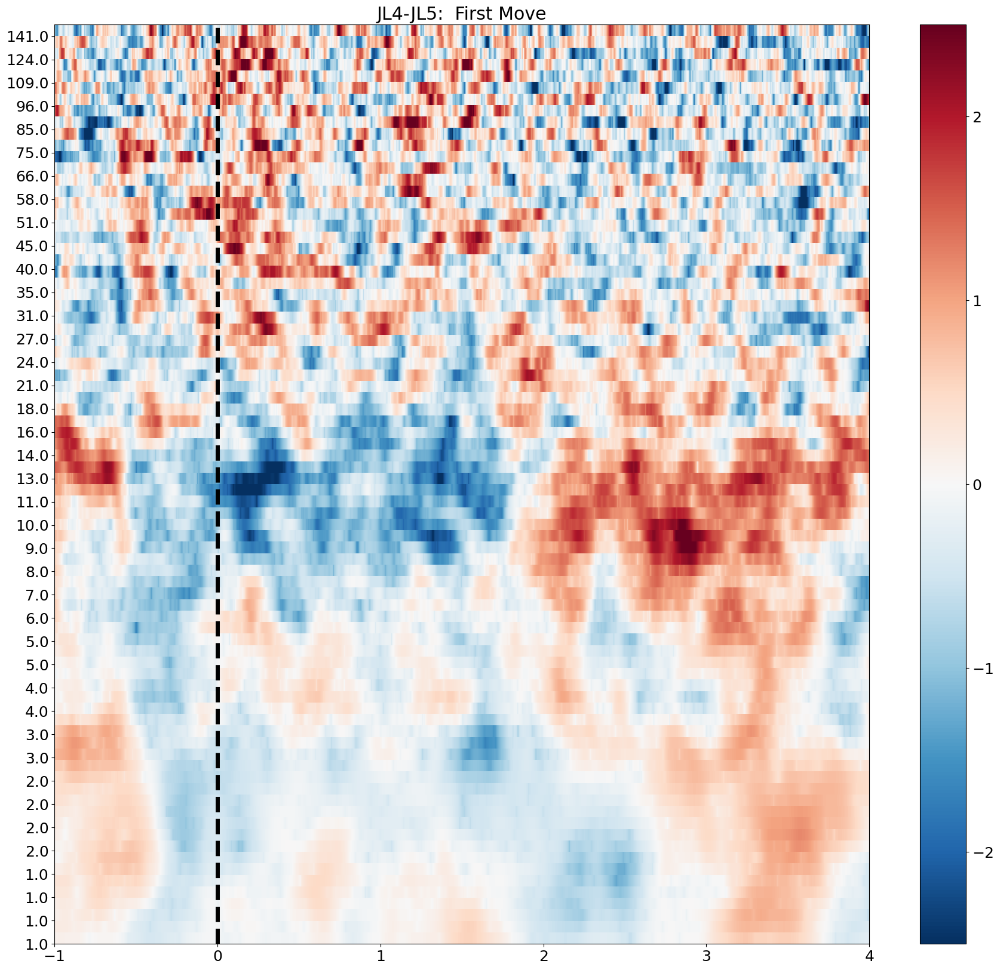

...

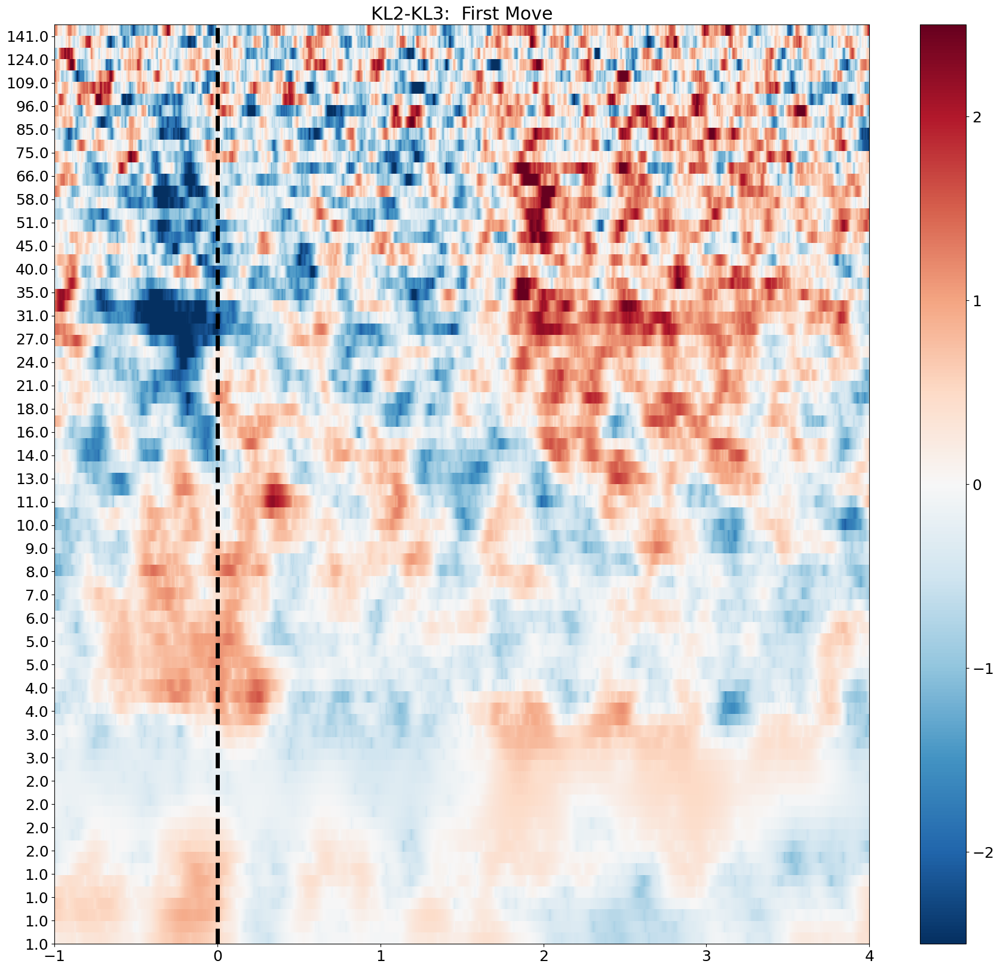

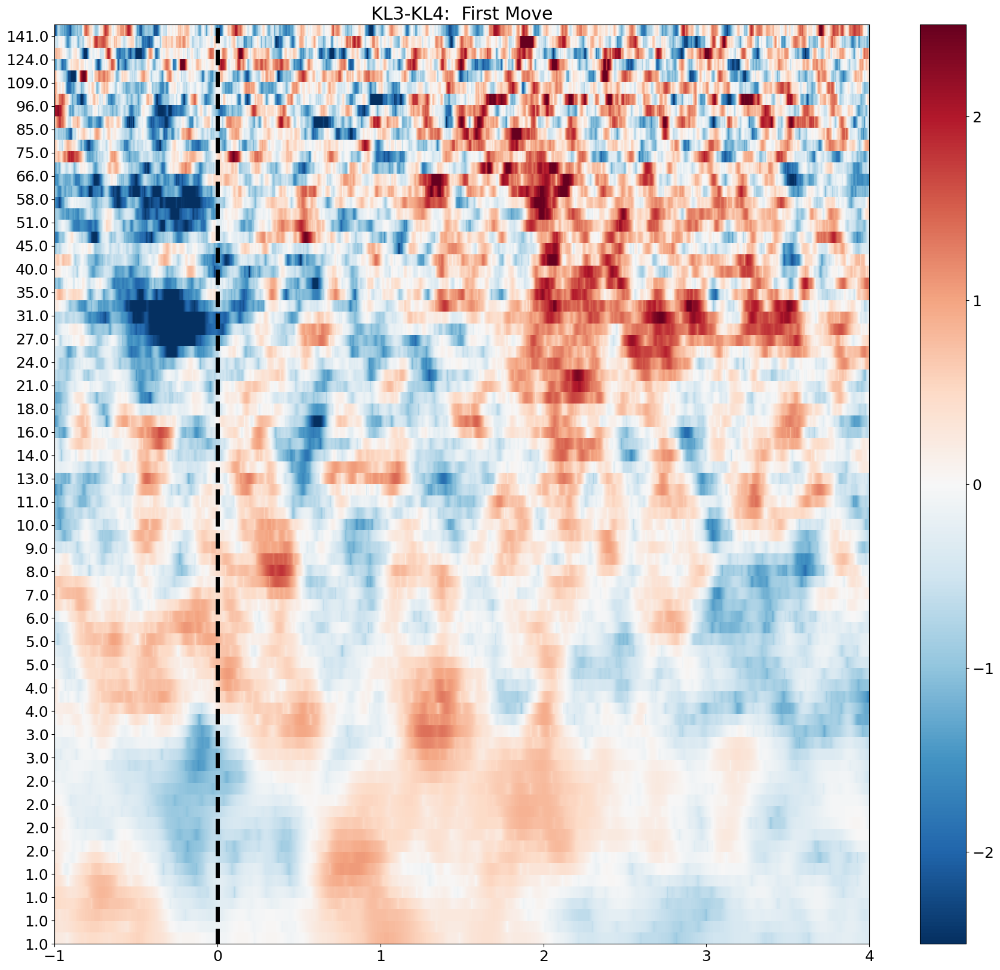

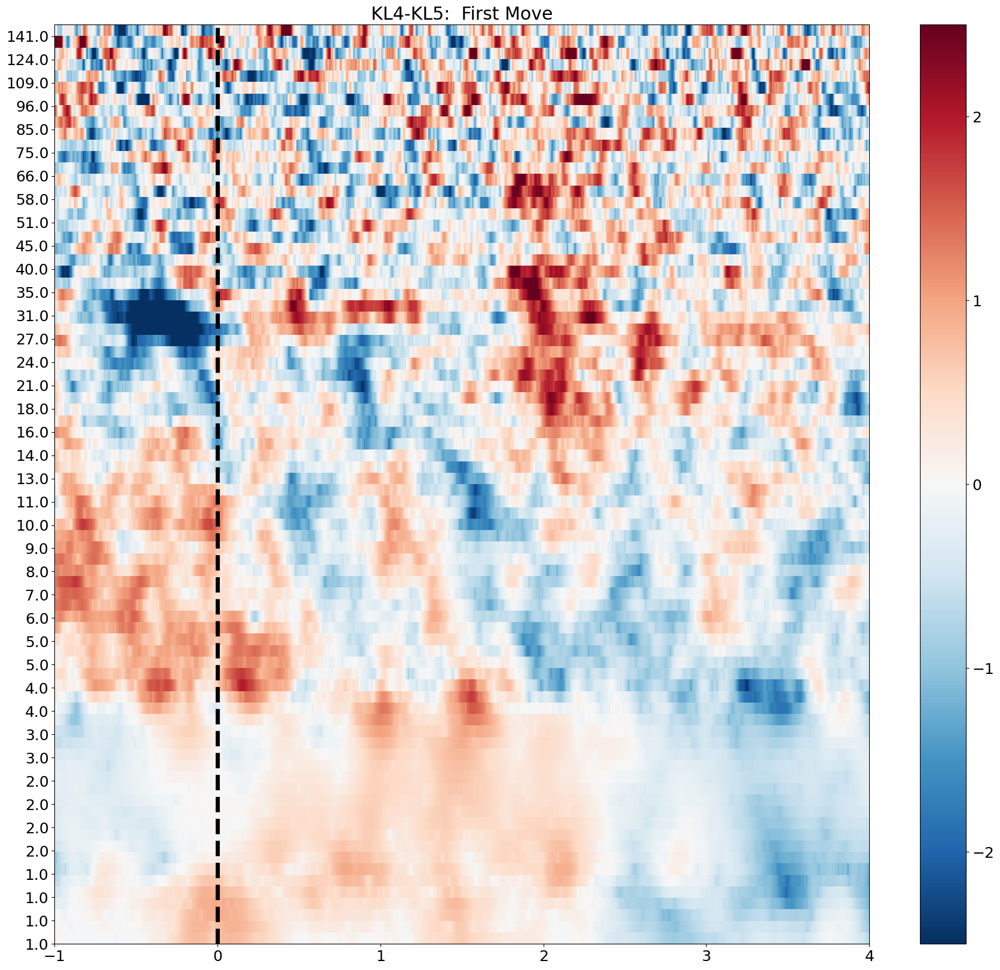

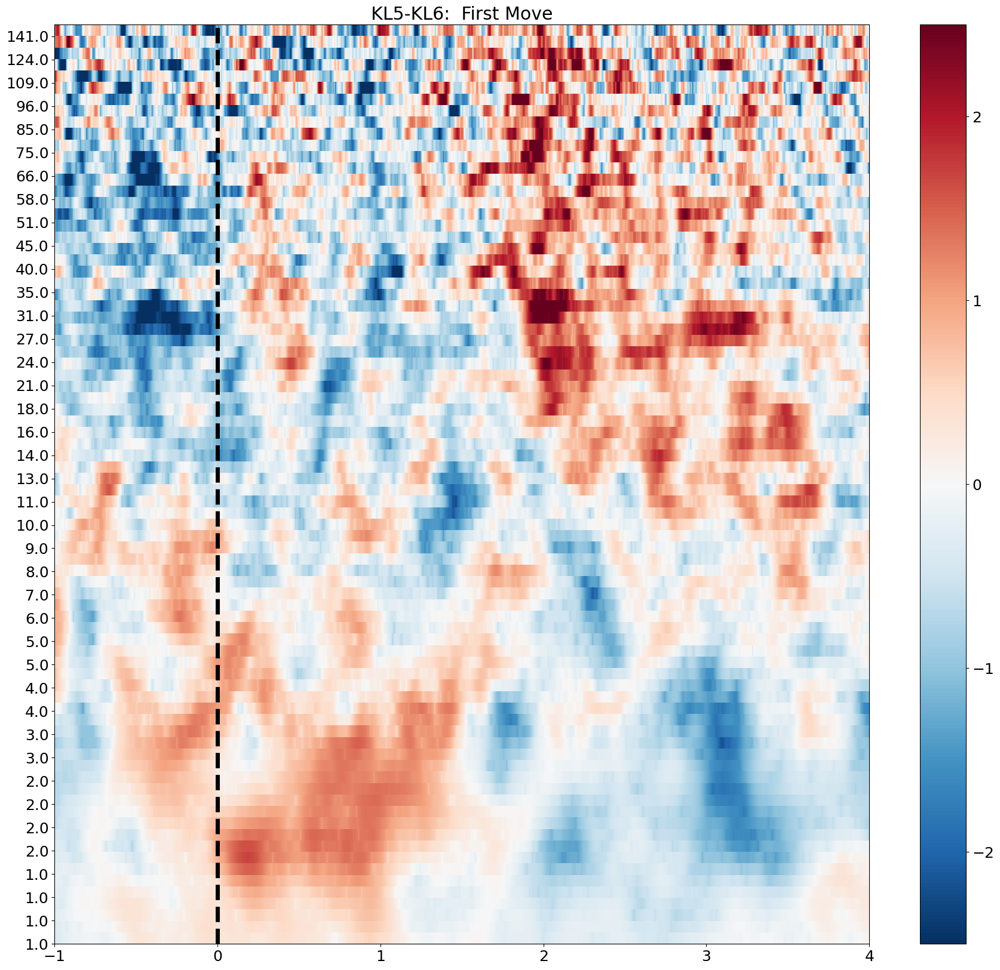

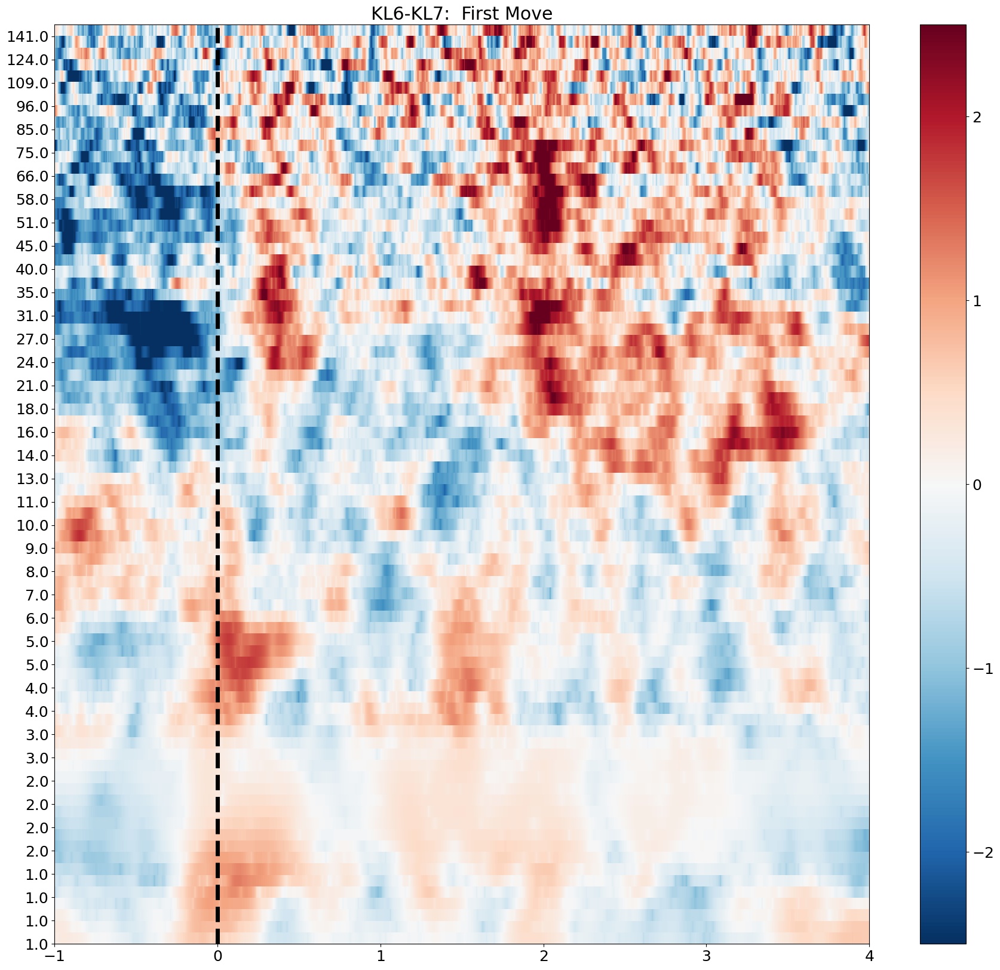

In [49]:
# Plot Channel TFR
for chix, ch in enumerate(roi_tfr.ch_names):

    pf.plot_channel_tfr(roi_tfr, chix, ch, 'First Move')

In [50]:
# save TFRs

roi_tfr["TrialType <= 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/ghost-insula-tfr.h5", overwrite = True)
roi_tfr["TrialType > 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/noghost-insula-tfr.h5", overwrite = True)


## dlPFC

In [51]:
dlpfc_list

['ML4-ML5',
 'ML5-ML6',
 'ML6-ML7',
 'ML7-ML8',
 'ML8-ML9',
 'ML9-ML10',
 'ML10-ML11']

In [52]:
# Only ROI
first_move_roi = first_move_epochs.copy().pick_channels(dlpfc_list)


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [53]:
# Resample to 1000 
if first_move_roi.info['sfreq'] > 1000:
    first_move_roi= first_move_roi.resample(1000)

In [54]:
# compute TRF

roi_tfr = []
roi_tfr = pf.compute_TFR(first_move_roi,pf.freqs,pf.n_cycles)

computing TFR
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.


[Parallel(n_jobs=8)]: Done   2 out of   7 | elapsed:  1.3min remaining:  3.1min


[Parallel(n_jobs=8)]: Done   4 out of   7 | elapsed:  1.4min remaining:  1.0min


[Parallel(n_jobs=8)]: Done   7 out of   7 | elapsed:  1.5min finished


In [55]:
roi_tfr.crop(tmin = -1, tmax = 4)


Data type,Power Estimates
Data source,Epochs
Number of epochs,159
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,7
Number of timepoints,5001
Number of frequency bins,80
Frequency range,1.00 – 150.00 Hz


In [56]:
# Log and zscore

roi_tfr = pf.log_and_zscore_TFR(roi_tfr, baseline = (-1,4), logflag=True)

log transforming


z-scoring to baseline


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:145: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


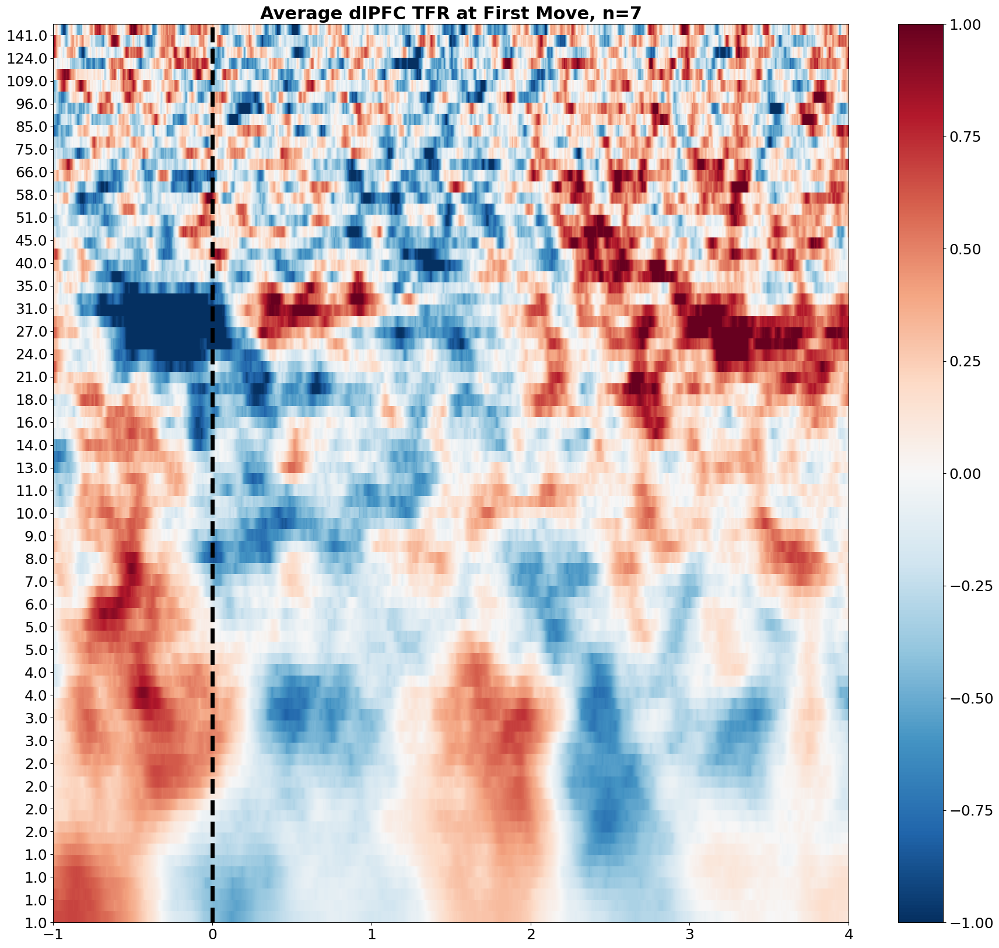

In [57]:
# Plot TFR
pf.plot_average_tfr(roi_tfr, f"Average dlPFC TFR at First Move, n={len(dlpfc_list)}", subject, 'dlpfc_firstmove')

### Individual Channels

/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


/home/brooke/pacman/preprocessing/scripts/preproc_functions.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


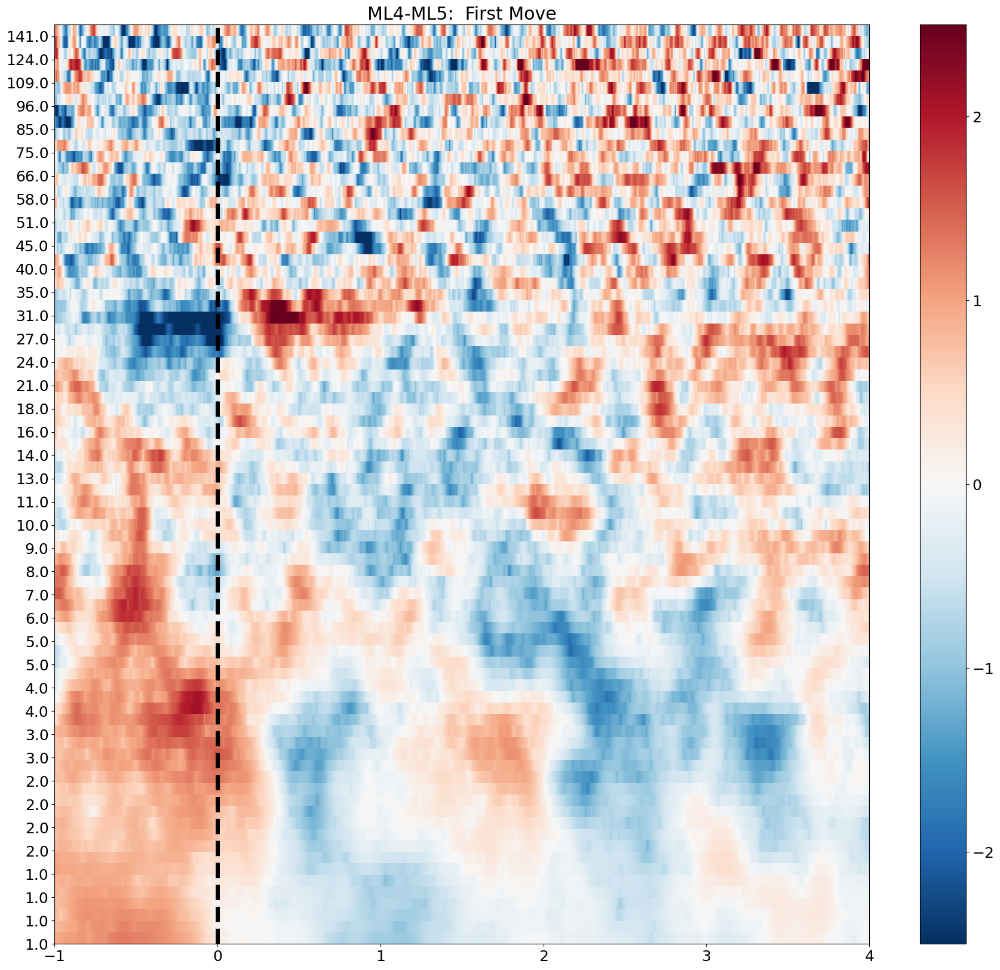

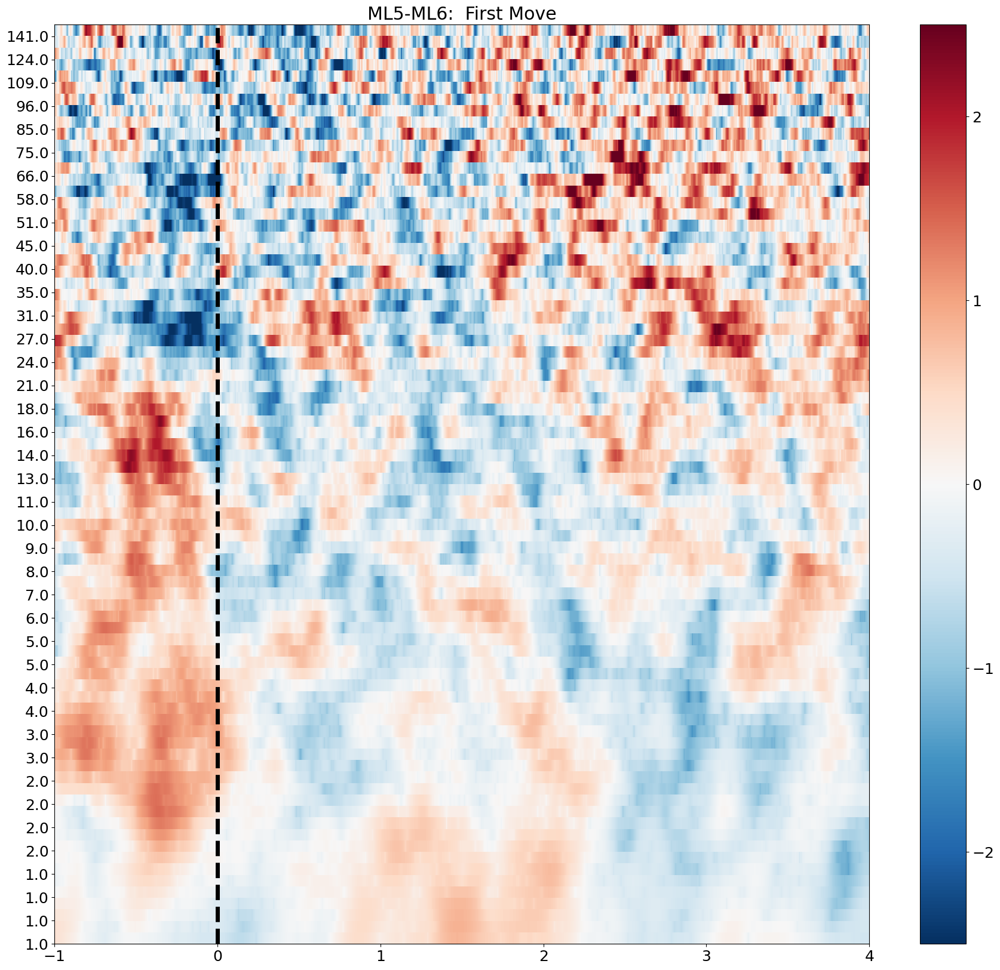

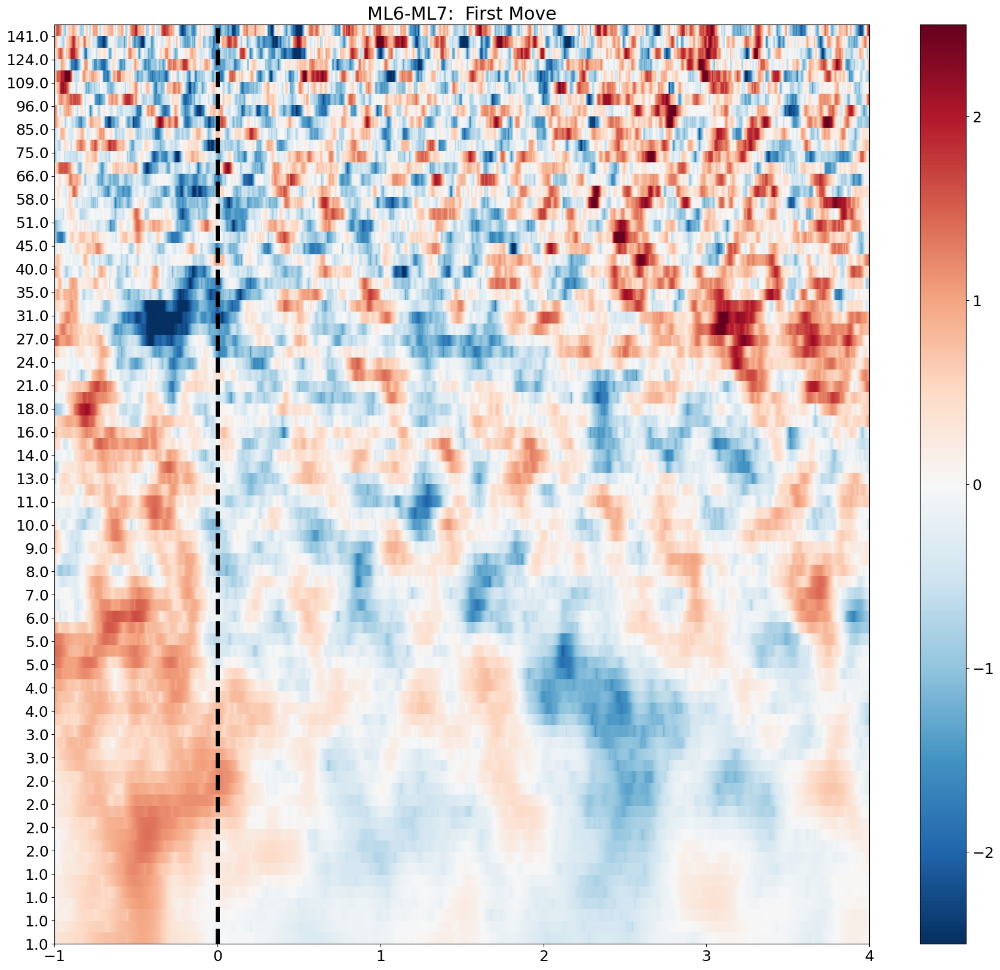

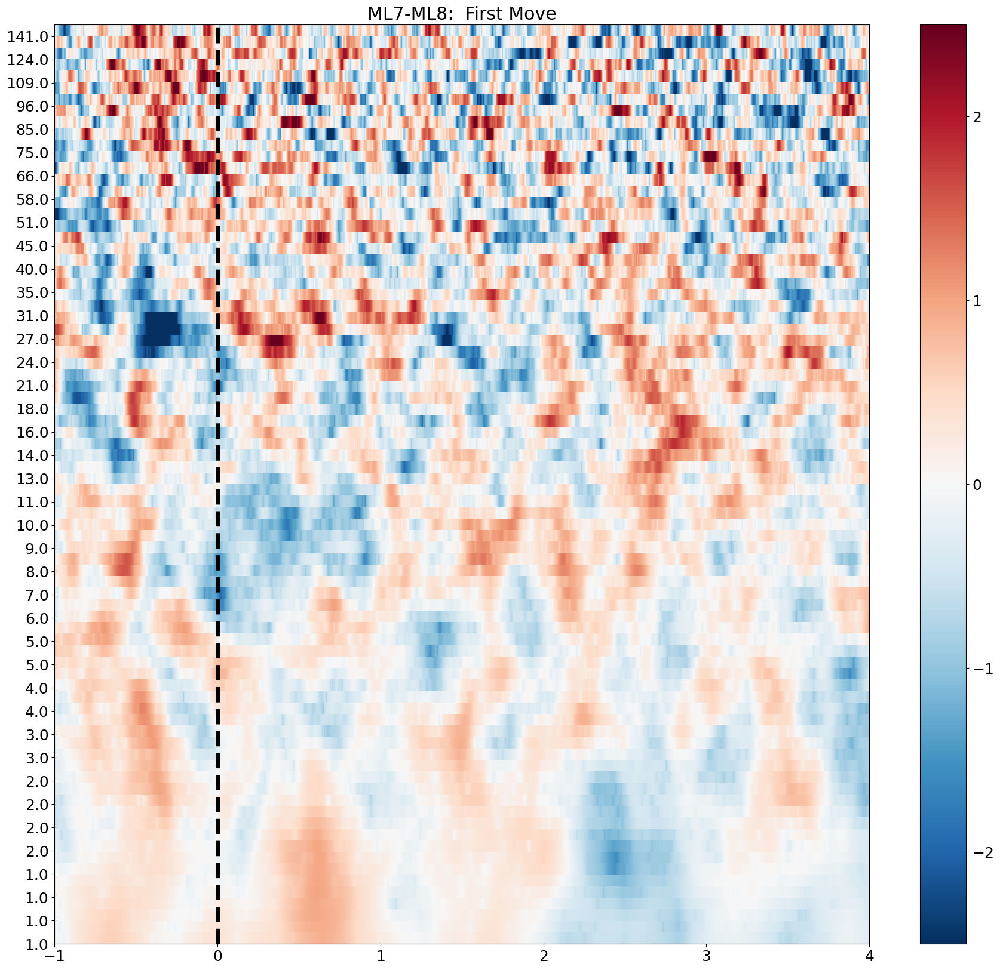

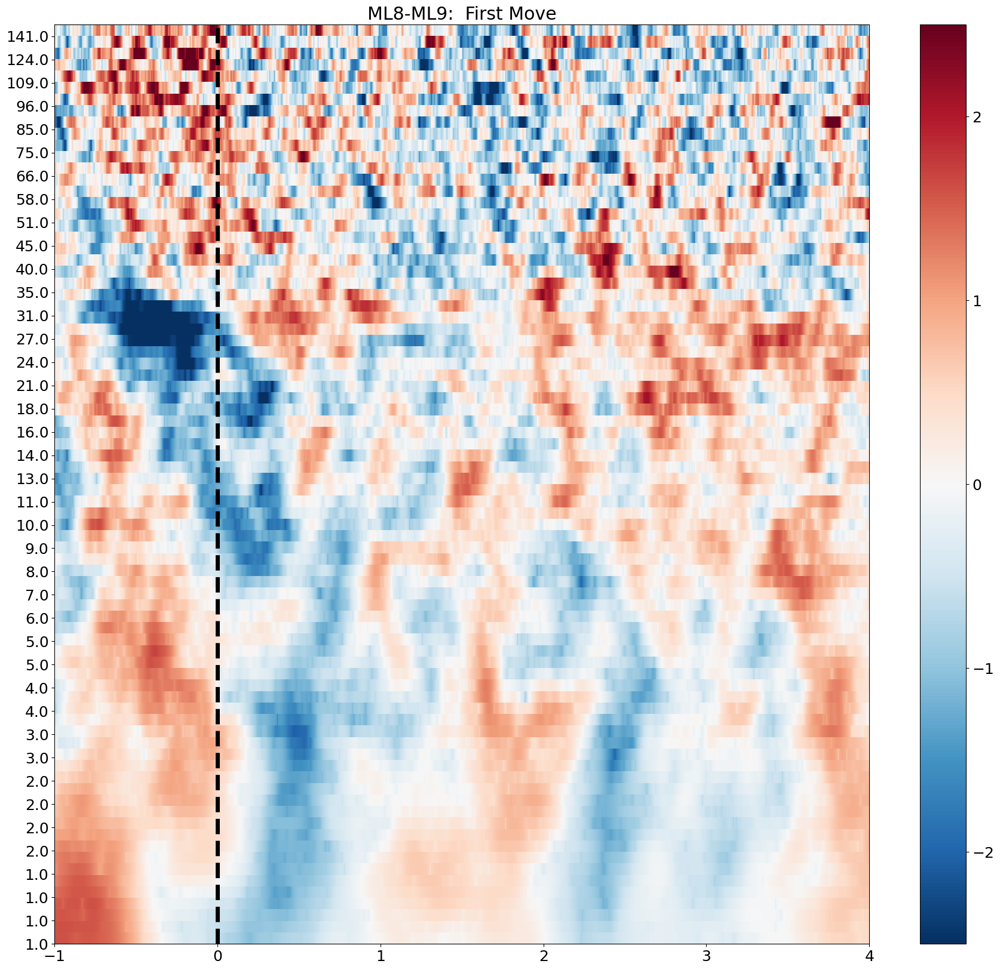

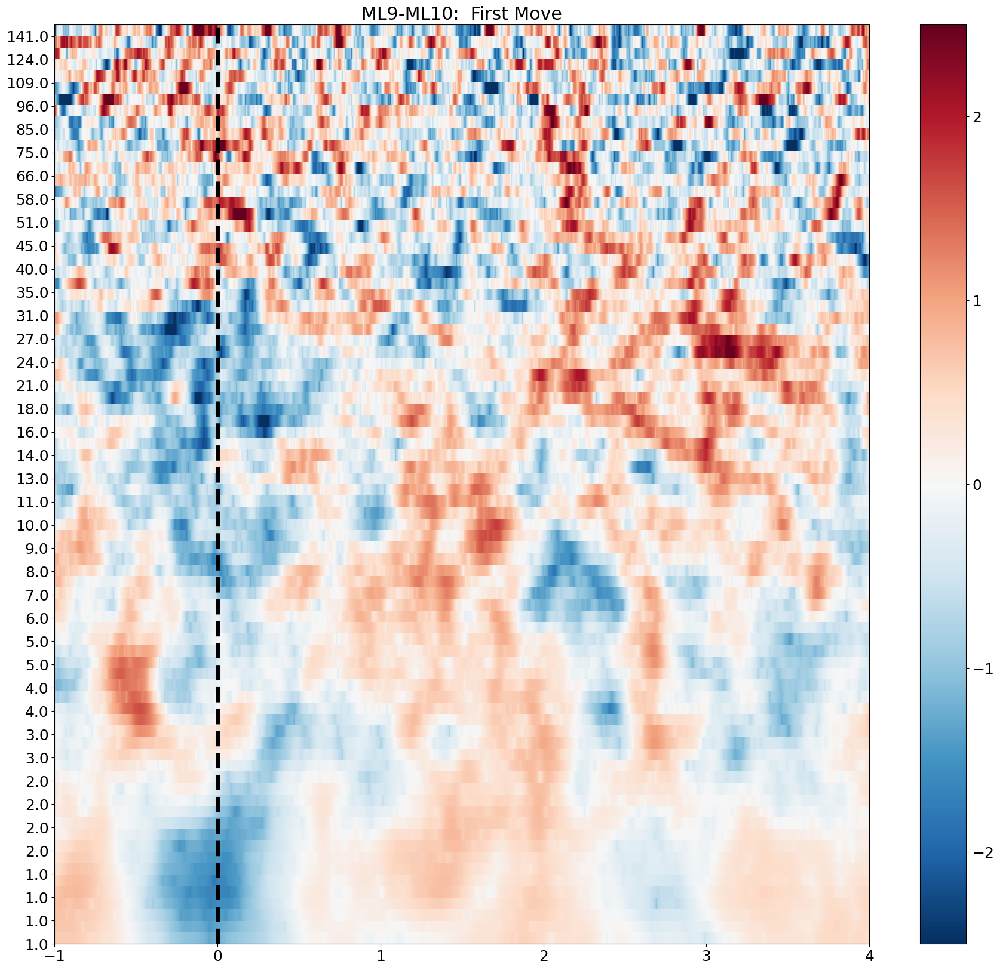

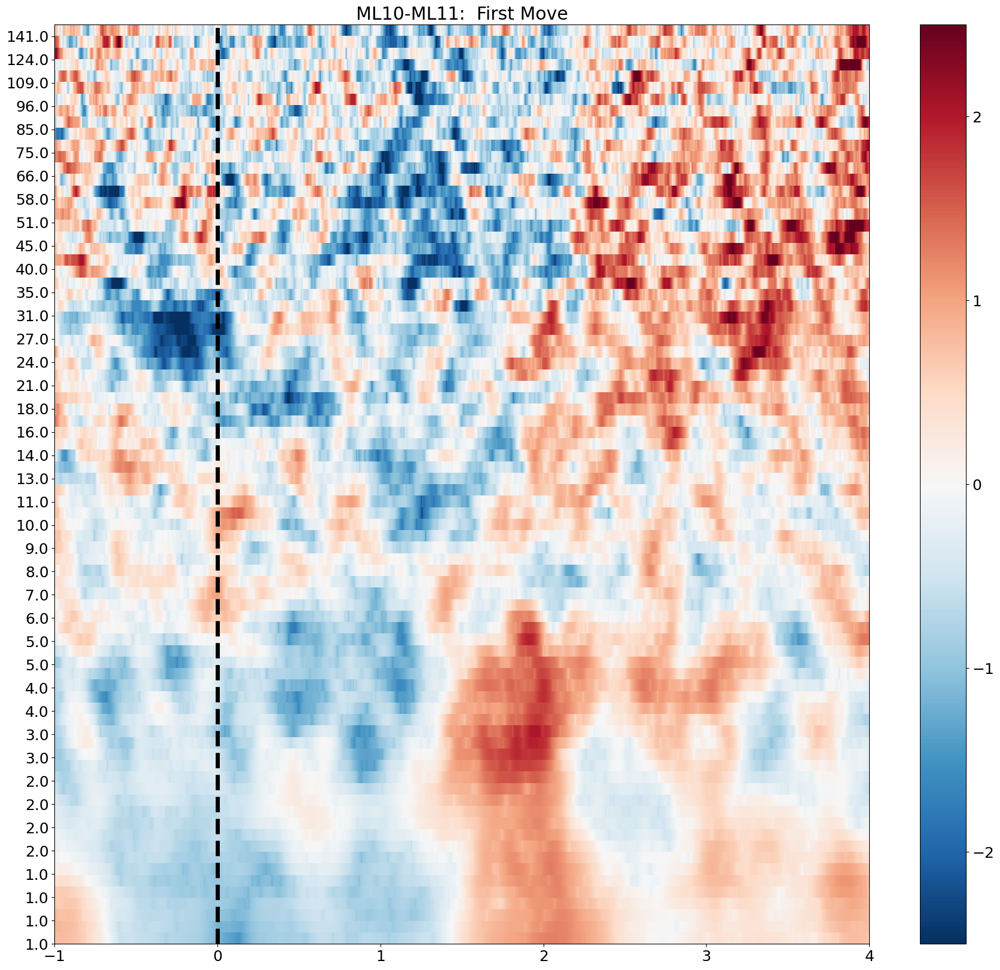

In [58]:
# Plot Channel TFR
for chix, ch in enumerate(roi_tfr.ch_names):

    pf.plot_channel_tfr(roi_tfr, chix, ch, 'First Move')

In [59]:
# save TFRs

roi_tfr["TrialType <= 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/ghost-dlpfc-tfr.h5", overwrite = True)
roi_tfr["TrialType > 16"].average(method = 'mean', dim = 'epochs').save(f"/home/brooke/pacman/preprocessing/{subject}/ieeg/first_move/noghost-dlpfc-tfr.h5", overwrite = True)
